In [17]:
%matplotlib inline

In [33]:
import matplotlib.pyplot as plt
import numpy as np
import healpy as hp

In [1]:
import numpy as np
import seaborn as sns
import healpy as hp
from astropy.io import fits
from matplotlib import gridspec
from matplotlib import ticker
from scipy.integrate import quad
import lib.cmb
import lib.noise
import calculations
import util.plot_funcs
import time
import pickle

%pylab inline

pylab.rcParams['figure.figsize'] = (10.0, 8.0)

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python2.7/site-packages/pytz/__init__.py:35: UserWarning: Module argparse was already imported from /usr/local/Cellar/python/2.7.3/Frameworks/Python.framework/Versions/2.7/lib/python2.7/argparse.pyc, but /usr/local/lib/python2.7/site-packages is being added to sys.path
  from pkg_resources import resource_stream


NOTES/TODO:

Make hits map generator
    - Do for single pixels in 4 corners of array
    - Also do for full sky
    - See how much overlap we have of full arrays
    
Inject gain noise and measure B-mode contamination
    - Start with r = 0 cmb realization
    - Make gain transfer function (in C_l space, constant function with a tick up at the desired ell)
    - Make M realizations of gain transfer function
    - Multiply cmb realization with gain transfer function realization
    - Generate ILC with each cmb*gain map
    - Estimate C_l's from each ILC map
    - Repeat for N cmb realizations (N*M total runs)
    - Repeat for L ell bins (how many???)

In [56]:
from IPython import parallel as p
rc = p.Client()
cluster = rc[:]
cluster.block = True

In [13]:
reload(calculations.util)

Importing calibration_gain.
cldict_normal_test already exists at /Users/jlazear/github/cmb/data/cldict_normal_test.hd5. Loading it.
cldict_noise already exists at /Users/jlazear/github/cmb/data/cldict_noise.hd5. Loading it.
Finished importing calibration_gain.


<module 'calculations.util' from 'calculations/util.py'>

In [25]:
import calculations.util, calculations.calibration_gain
read_dict_from_hd5 = calculations.calibration_gain.read_dict_from_hd5

In [26]:
a4ln = read_dict_from_hd5('data/all_4_lownoise.hd5')['all_4_lownoise']

In [27]:
testdata = a4ln['ell_5']

(2.0, 10)

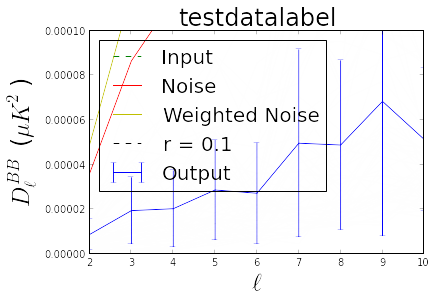

In [30]:
fig = calculations.util.myplot(testdata, 'testdata', 'testdatalabel')
ax = fig.axes[0]
ax.set_ylim(ymax=.0001)
ax.set_xscale('linear')
ax.set_xlim(xmax=10)

In [36]:
npix = hp.nside2npix(512)
calmap = np.array([1.]*npix)
np.unique(hp.anafast(calmap))

array([ 0.])

Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


The order of the input cl's will change in a future release.
Use new=True keyword to start using the new order.
See documentation of healpy.synalm.


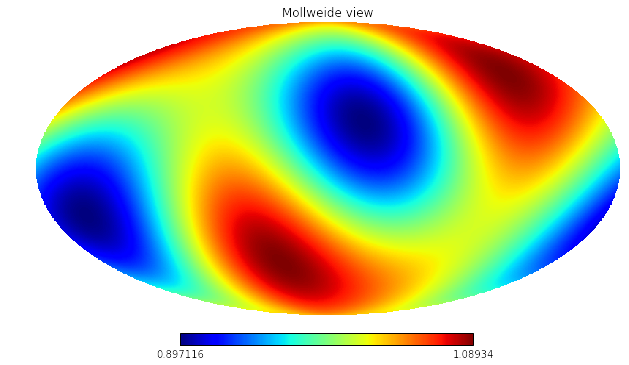

In [82]:
cls = np.zeros(400)
cls[2] = 1
map1 = hp.synfast(cls, 512)
map1 = 1. + map1*0.05/map1.std()
hp.mollview(map1)

The order of the input cl's will change in a future release.
Use new=True keyword to start using the new order.
See documentation of healpy.synalm.
The order of the input cl's will change in a future release.
Use new=True keyword to start using the new order.
See documentation of healpy.synalm.


Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
1423.33038761


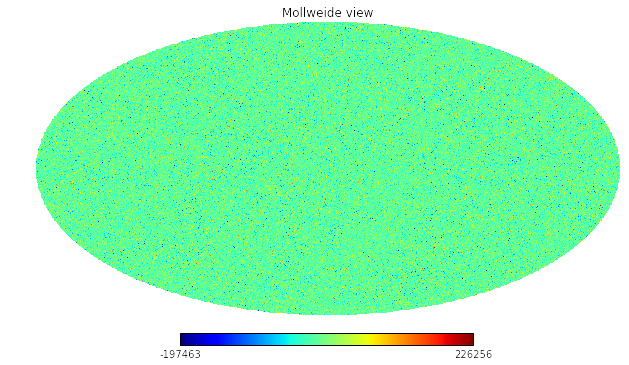

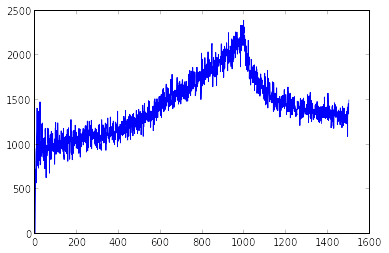

In [114]:
cls_gain = np.zeros(1500)
cls_gain[500] = 1
map_gain = hp.synfast(cls_gain, 512)
gain_error = np.sqrt(2)
map_gain = 1. + map_gain*gain_error/map_gain.std()

cls_cmb = np.arange(1500, dtype='float')
map_cmb = hp.synfast(cls_cmb, 512)

map_combined = map_gain*map_cmb
hp.mollview(map_combined)
cls_recon = hp.anafast(map_combined, lmax=len(cls_gain)-1)
plt.figure()
plt.plot(cls_recon - cls_cmb)
print (cls_recon - cls_cmb).mean()
#plt.plot(cls_cmb)
#plt.yscale('log')

In [46]:
retvalues = cluster.apply_sync(testfunc, range(5), a=a)
retvalues[:]

[{'a': array([2])}, {'a': array([2])}]

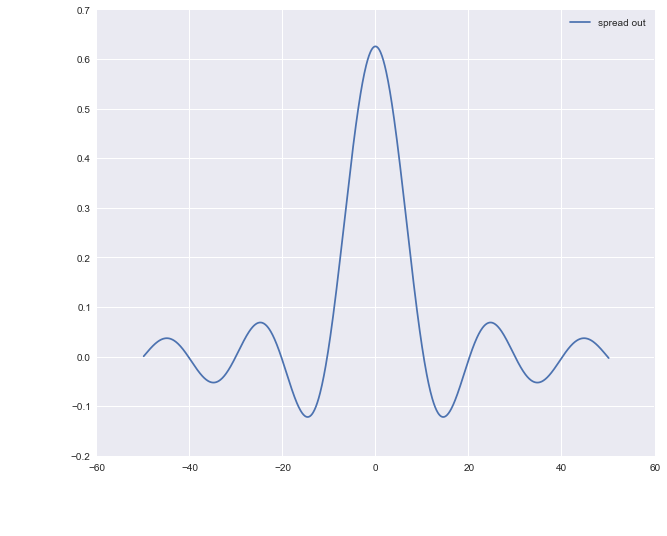

In [795]:
tau = 3.
T = .1
N = 20

def filter(f, tau, T, N):
    ns = np.arange(0, N) - N//2
    return (1./tau)*np.sum(T*np.sinc(T*(f - ns/tau)))
filter = np.vectorize(filter)

fs = np.linspace(-50, 50, 1000)
# fs = np.linspace(-2, 2, 1000)

plot(fs, filter(fs, tau=tau, T=T, N=N), label='spread out')
# plot(fs, N*T*np.sinc(N*T*fs), label='all together')
legend()

In [725]:
print A_single
print Omega

1.288225e-06
0.242406840555


In [664]:
reload(util.plot_funcs)

<module 'util.plot_funcs' from 'util/plot_funcs.py'>

In [57]:
myfname = 'data/lcdm_planck_2013_cl_lensed.dat'
first, _ = myfname.rsplit('.dat')
second, _ = first.rsplit('_lensed', 1)
second.rsplit('_cl', 1)

['data/lcdm_planck_2013', '']

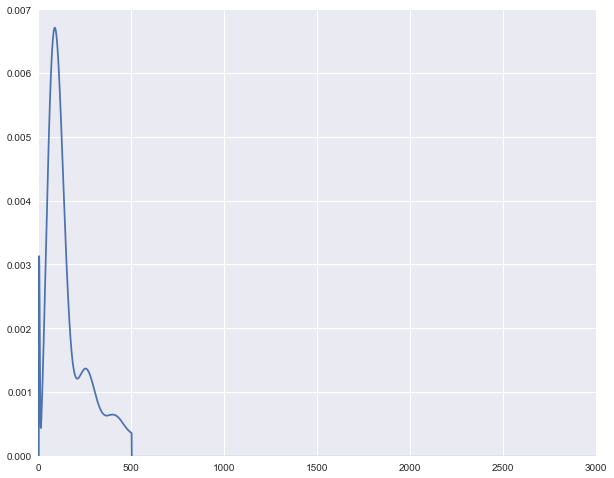

In [66]:
print lib.cmb.generate_cls(input='README.md', output='junk/explanatory_')
cldict = lib.cmb.get_dls(fname='junk/explanatory_cl.dat', lensed=False)

plot(cldict['ell'], cldict['BB'])

Running CLASS version v2.3.1
Computing background
 -> age = 13.461689 Gyr
 -> conformal age = 13893.996602 Mpc
Computing thermodynamics with Y_He=0.2487
 -> recombination at z = 1086.807512
    corresponding to conformal time = 278.732613 Mpc
    with comoving sound horizon = 142.256131 Mpc
    angular diameter distance = 12.516244 Mpc
    and sound horizon angle 100*theta_s = 1.044828
 -> baryon drag stops at z = 1064.650406
    corresponding to conformal time = 283.022684 Mpc
    with comoving sound horizon rs = 144.161626 Mpc
 -> reionization with optical depth = 0.084456
    corresponding to conformal time = 4458.025551 Mpc
Computing sources
Computing primordial spectra (analytic spectrum)
No non-linear spectra requested. Nonlinear module skipped.
Computing transfers
Computing unlensed linear spectra
Computing lensed spectra (fast mode)
Writing output files in junk/explanatory_... 



(2, 500)

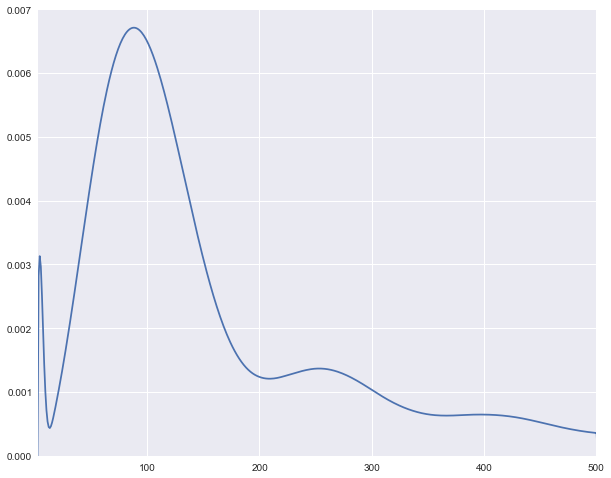

In [53]:
print lib.cmb.generate_cls(input='explanatory.ini', output='junk/explanatory_')
pdict = lib.cmb.get_lcdm_dls(lensed=False, fname='junk/explanatory_cl.dat')
plot(pdict['ell'], pdict['BB'])
xlim([2, 500])

In [41]:
reload(calculations.ilc_foreground_cleaning)
import calculations
# retdict2 = calculations.ilc_foreground_cleaning.polarized_ilc_reconstruction(freqs2, _debug=True,
#                  fname='junk/explanatory_cl.dat', lensed=False, regnoise=700.)

In [1151]:
Omega_pixel

3.994741635118857e-06

In [1114]:
Omega_single = 7.45446e-6  # sr, from bjohnson report
Omega_array = 9.54171e-3  # sr, from bjohnson report
m = 81  # uK_CMB sqrt(sr)
print m/np.sqrt(Omega_single), "uK per detector beamspot"
print m/np.sqrt(Omega_array), 'uK per array beamspot'

Omega_pixel = hp.nside2pixarea(512)

print m/np.sqrt(Omega_pixel), 'uK per Nside=512 pixel'

regnoise = 3.*np.sqrt(Omega_array/Omega_pixel)  # uK/pixel
print regnoise
# regnoise = 3.*np.sqrt(Omega_single/Omega_array)  # uK/pixel
# regnoise

29667.2249427 uK per detector beamspot
829.224093802 uK per array beamspot
40526.6467473 uK per Nside=512 pixel
146.618919


In [1154]:
print 'array/pixel', 3.*np.sqrt(Omega_array/Omega_pixel)  # uK/pixel
print 'pixel/array', 3.*np.sqrt(Omega_pixel/Omega_array)  # uK/pixel
print 'single/pixel', 3.*np.sqrt(Omega_single/Omega_pixel)  # uK/pixel
print 'pixel/single', 3.*np.sqrt(Omega_pixel/Omega_single)  # uK/pixel

array/pixel 146.618919
pixel/array 0.0613836199407
single/pixel 4.09812311319
pixel/single 2.19612728838


In [20]:
cl0p1dict = lib.cmb.get_cls(lensed=False, fname='junk/r0p1_cl.dat')

In [1225]:
# Load data
from lib.wmap import load_wmap_maps, load_wmap_masks
import lib.ilc

bands = ['K', 'Ka', 'Q', 'V', 'W']
fnames = ['data/wmap_band_smth_imap_r9_9yr_{0}_v5.fits'.format(band)
          for band in bands]
maskdata = 'data/wmap_ilc_rgn_defn_9yr_v5.fits'

print "Loading WMAP data..."
maps = load_wmap_maps(fnames)
masks, region = load_wmap_masks(maskdata)

# Compute weights
print "Computing ILC weights..."
nregions = masks.shape[0]
import time
t0 = time.time()
ws = lib.ilc.compute_ilc_weights(maps, masks)
ws2 = lib.ilc.compute_ilc_weights(maps, masks, noisefactor=True)
tf = time.time()
print "Computed ILC weights for {0} regions in {1} seconds.".format(
    nregions, tf - t0)

# Print weights
print "ILC weights"
linestr = "{0:^10} {1:^10} {2:^10} {3:^10} {4:^10} {5:^10}"
print linestr.format(*(['GROUP'] + bands))
for i in range(len(ws)):
    linelist = [i] + [str(w).ljust(8, '0')[:8] for w in ws[i]]
    print linestr.format(*linelist)
print
print linestr.format(*(['GROUP'] + bands))
for i in range(len(ws)):
    linelist = [i] + [str(w).ljust(8, '0')[:8] for w in ws2[i]]
    print linestr.format(*linelist)

Loading WMAP data...
Computing ILC weights...
Computed ILC weights for 12 regions in 34.8607280254 seconds.
ILC weights
  GROUP        K          Ka         Q          V          W     
    0       0.155986   -0.76841   -0.24397   2.257494   -0.40108 
    1       0.055803   -0.64892   0.208869   1.945169   -0.56091 
    2       0.048720   -0.43987   -0.23540   1.851762   -0.22519 
    3       -0.09964   0.205965   -0.64152   1.560084   -0.02487 
    4       -0.07787   0.094598   -0.42622   0.967506   0.441998 
    5       0.209118   -0.80956   -0.41398   2.482037   -0.46760 
    6       -0.08915   0.169148   -0.51964   1.000231   0.439416 
    7       0.159301   -0.82604   -0.05642   2.157844   -0.43467 
    8       0.201858   -0.23001   -1.69478   3.628966   -0.90602 
    9       -0.09946   -0.10505   -0.05691   1.156837   0.104587 
    10      0.176710   -0.92922   -0.06826   2.746804   -0.92602 
    11      0.237338   -0.85279   -0.59759   2.827484   -0.61443 

  GROUP        K     

Constructing ILC map from weights...
Plotting ILC map. Close figure to exit.


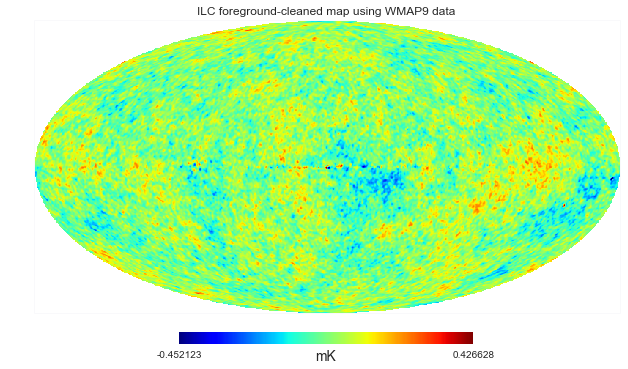

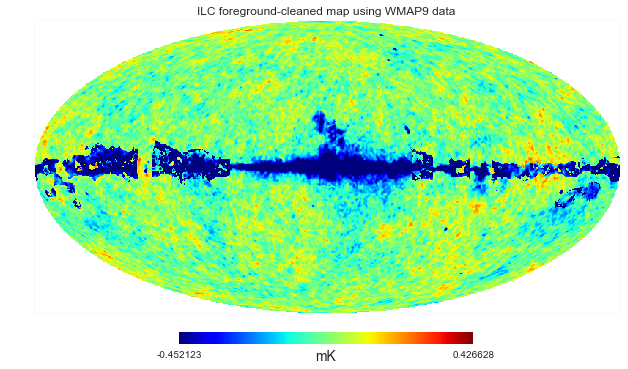

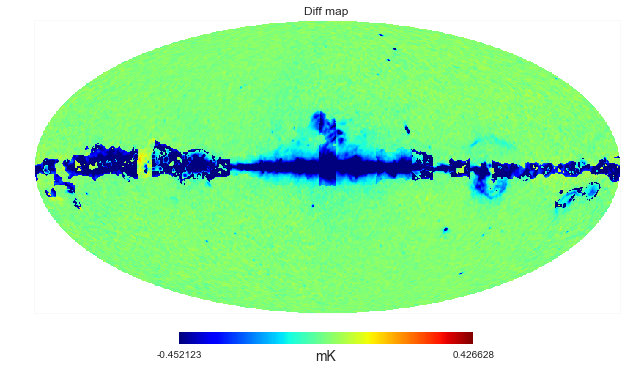

In [1227]:
# Construct ILC map
print "Constructing ILC map from weights..."
T_hat = lib.ilc.ilc_map_from_weights(maps, ws, region, sigma=None)
T_hat2 = lib.ilc.ilc_map_from_weights(maps, ws2, region, sigma=None)

# Display ILC map
print "Plotting ILC map. Close figure to exit."
hp.mollview(T_hat, title='ILC foreground-cleaned map using WMAP9 data',
            unit='mK', min=-.452123, max=.426628)
hp.mollview(T_hat2, title='ILC foreground-cleaned map using WMAP9 data',
            unit='mK', min=-.452123, max=.426628)
hp.mollview(T_hat2 - T_hat, title='Diff map', unit='mK',
            min=-.452123, max=.426628)

In [26]:
plt.subplots?

In [204]:
reload(lib.cmb)
reload(lib.ilc)
reload(calculations.ilc_foreground_cleaning)
import calculations

In [74]:
from __future__ import print_function

def many_realizations(freqs, N=100, xxs=['BB'], fname=None, regnoise=0., lensed=False,
                      modcov=False, verbose=False, **kwargs):
    print("Finished: {0} of {1}".format(0, N), end='\r')
    reconfunc = calculations.ilc_foreground_cleaning.polarized_ilc_reconstruction
    cldict = {key: [] for key in xxs}
    cldict['weights_Q'] = []
    cldict['weights_U'] = []
    for i in range(N):
        regendust = True if (i == 0) else False
        retdict = reconfunc(freqs, _debug=False, fname=fname, regnoise=regnoise, 
                            lensed=lensed, verbose=verbose, modcov=modcov,
                            regeneratedust=regendust)
        cl_out = retdict['cl_out']
        for key in xxs:
            cldict[key].append(cl_out[key])
        cldict['weights_Q'].append(retdict['weights_Q'])
        cldict['weights_U'].append(retdict['weights_U'])
        
        print("Finished: {0} of {1}".format(i+1, N), end='\r')
    print("\n")

    for key, value in cldict.items():
        cldict[key] = np.array(value)
        cldict[key + '_mean'] = np.mean(cldict[key], axis=0)
        cldict[key + '_std'] = np.std(cldict[key], axis=0)

    cldict['ell'] = cl_out['ell']
    cldict['regnoise'] = retdict['regnoise']

    return cldict

cl0p1dict = lib.cmb.get_cls(lensed=False, fname='junk/r0p1_cl.dat')


Omega_single = 7.45446e-6  # sr, from bjohnson report
Omega_pixel = hp.nside2pixarea(512)  # pixel solid angle in sr
Omega_array = 9.54171e-3  # sr, from bjohnson report
regnoise = 3./1.3*np.array([1.3, 1.9, 6.7, 110.])*np.sqrt(Omega_single/Omega_pixel)  # uK/pixel
fname = 'junk/explanatory_cl.dat'
lensed = False
modcov = False

cldict_normal_test = calculations.ilc_foreground_cleaning.polarized_ilc_reconstruction(
                        frequencies=np.array([200., 270., 350., 600.])*1.e9, fname=fname, 
                        regnoise=regnoise, lensed=lensed, modcov=modcov, verbose=True)

noisemap = cldict_normal_test['noisemaps'][0][0]
cls_noise = hp.anafast([noisemap, noisemap, noisemap])
labels = ['TT', 'EE', 'BB', 'TE', 'EB', 'TB']
cldict_noise = {labels[i]: cls_noise[i] for i in range(len(labels))}
cldict_noise['ell'] = np.arange(len(cldict_noise['TT']), dtype='float')

prefix_noise = cldict_noise['ell']*(cldict_noise['ell'] + 1)/(2*np.pi)

def myplot(cld, name, label, nf=1.):
    figure()
    ell = cld['ell']
    prefix = ell*(ell+1)/(2*np.pi)
    
    for bb in cld['BB']:
        plot(ell, prefix*bb, 'k-', alpha=.015)

    bbmean = cld['BB_mean']
    bbstd = cld['BB_std']
    errorbar(ell, prefix*bbmean, yerr=prefix*bbstd, label='Output')
    plot(ell, 0*ell, 'g--', label='Input')

    nmax = where(ell<20.)[0][-1]
    # bbmax = prefix[nmax]*(bbmean[nmax] + 5*bbstd[nmax])*2
    bbmax = 0.1 # 0.007
    # ylim(ymax=bbmax)
    ylim([0, bbmax])
    # xlim(xmin=2, xmax=20)
    xlim(xmin=2, xmax=150)
    xscale('log')

    xlabel(r'$\ell$', fontsize=24)
    ylabel(r'$D_\ell^{BB}$ ($\mu K^2$)', fontsize=24)

    ell0p1 = cl0p1dict['ell']
    bb0p1 = cl0p1dict['BB']
    prefix = ell0p1*(ell0p1 + 1)/(2*np.pi)

    # Plot base noise level
    prefix_noise = cldict_noise['ell']*(cldict_noise['ell'] + 1)/(2*np.pi)
    plot(cldict_noise['ell'], prefix_noise*cldict_noise['BB']*nf**2, 'r-', label='Noise')

    # Plot weight-scaled noise level
    wQs = cld['weights_Q']
    wUs = cld['weights_U']
    wavg = (0.5*(wQs + wUs)).mean(axis=0)
    rnfact = cld['regnoise']/cld['regnoise'].min()
#     wfact = np.sum(wavg**2)
#     wfact = np.sum(np.abs(wavg)*rnfact)
#     wfact = np.sqrt(np.sum(wavg**2 * rnfact))
    wfact = np.sqrt(np.sum((wavg*rnfact)**2))*nf**2
    
    plot(cldict_noise['ell'], prefix_noise*cldict_noise['BB']*wfact, 'y-', label='Weighted Noise')
    
    plot(ell0p1, prefix*bb0p1, 'k--', label='r = 0.1')
    legend(loc='upper left', fontsize=20)
    title(label, fontsize=24)
    savefig(name + '.png', dpi=150) 
    f = gcf()
    return f

def save_data(results, fname='results.pickle'):
    copydict = results.copy()
    for key in copydict.keys():
        del copydict[key]['figure']
    with open(fname, 'w') as f:
        pickle.dump(copydict, f)

--------------------------------------------------------------------------------
Performing ILC simulation with frequencies: [ 200.  270.  350.  600.] GHz
Constructing CMB temperature and polarization maps.
Loaded dust from file: /Users/jlazear/github/cmb/data/dust.npy
Combining maps.
Instrument/regularization noise with std dev [   4.09812311    5.98956455   21.12109604  346.76426342] uK
Performing ILC on Q/U maps separately.
Reconstructing ILC Q/U maps.
Computing C_l's from reconstructed maps.
Done with ILC with frequencies [ 200.  270.  350.  600.] GHz!
--------------------------------------------------------------------------------


Computing case: low_2_lownoise
freq = 200.0 GHz, factor = 0.40291038777
freq = 270.0 GHz, factor = 0.651242138951
Finished: 100 of 100

Finished computing (1238.85599995 s): low_2_lownoise
------------------------------


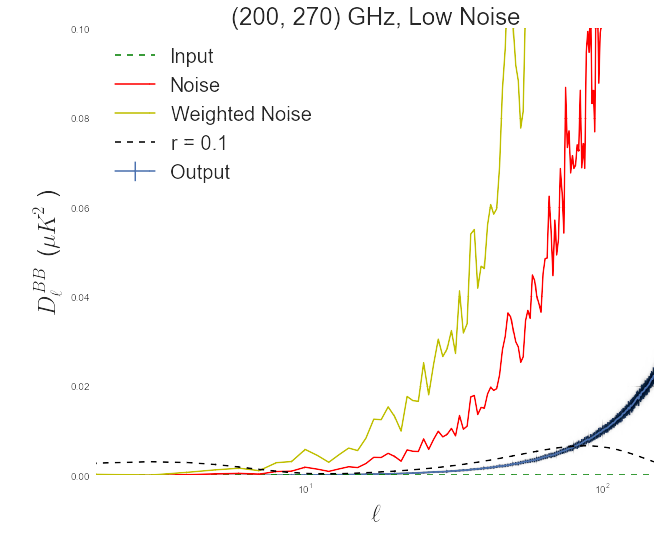

In [75]:
Omega_single = 7.45446e-6  # sr, from bjohnson report
Omega_pixel = hp.nside2pixarea(512)  # pixel solid angle in sr
noiselist = 3./1.3*np.array([1.3, 1.9, 6.7, 110.])*np.sqrt(Omega_single/Omega_pixel)  # uK/pixel
noisedict = dict(zip([200., 270., 350., 600.], noiselist))
# regnoise = 3.*np.sqrt(Omega_single/Omega_pixel)  # uK/pixel
fname = 'junk/explanatory_cl.dat'
lensed = False    # Include lensing?
noisefactor = 1.  # Noise level relative to PIPER target
modcov = False    # Efstathiou 2009 modified covariance?
verbose = False

baseargdict = {'lensed': lensed,
               'noisefactor': noisefactor,
               'modcov': modcov,
               'fname': fname,
               'verbose': verbose,
               'N': 100}

argdicts = {}
arglist = [('low_2_lownoise', [200., 270.], 0.1, '(200, 270) GHz, Low Noise'),
           #('all_4', [200., 270., 350., 600.], 1., 'All 4 Frequencies, Normal Noise'),
           #('low_high_2', [200., 600.], 1., '(200, 600) GHz, Normal Noise'),
           #('all_4_lownoise', [200., 270., 350., 600.], 0.1, 'All 4 Frequencies, Low Noise'),
           #('200_350', [200., 350.], 1., '(200, 350) GHz, Normal Noise'),
           #('350_600', [350., 600.], 1., '(350, 600) GHz, Normal Noise')
           ]

for i in arglist:
    name, freqs, noisefact, label = i
    regnoise = np.array([noisedict[float(freq)] for freq in freqs])
    freqs = np.array(freqs)*1.e9
    argdict = baseargdict.copy()
    argdict.update({'freqs': freqs, 'regnoise': regnoise*noisefact, 'noisefactor': noisefact})
    toadd = {'label': label, 'args': argdict}
    argdicts[name] = toadd

# ad = argdicts['low_2']  #DELME?
# results = {}

for name, ad in argdicts.items():
    t0 = time.time()
    print("Computing case: {0}".format(name))
    cld = many_realizations(**(ad['args']))
    results[name] = {'cldict': cld}
    f = myplot(cld, name, ad['label'])
    results[name]['figure'] = f
    tf = time.time()
    print("Finished computing ({1} s): {0}".format(name, tf - t0))
    print('-'*30)


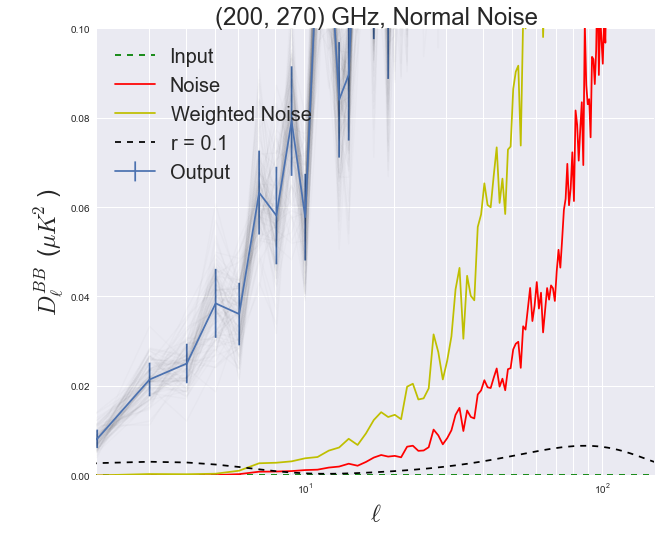

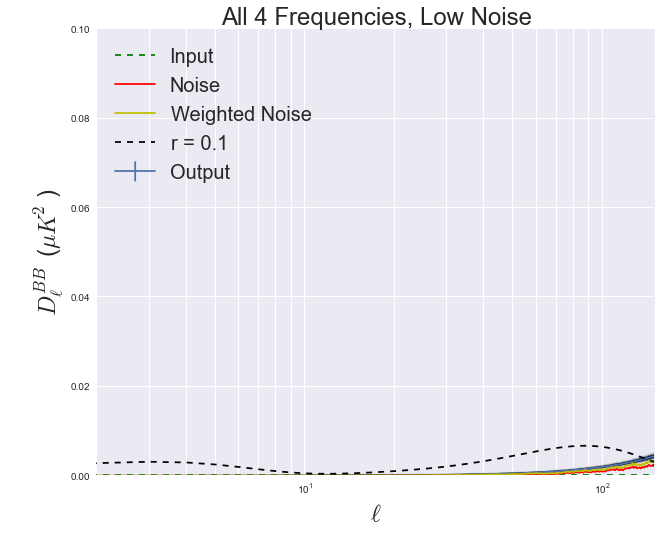

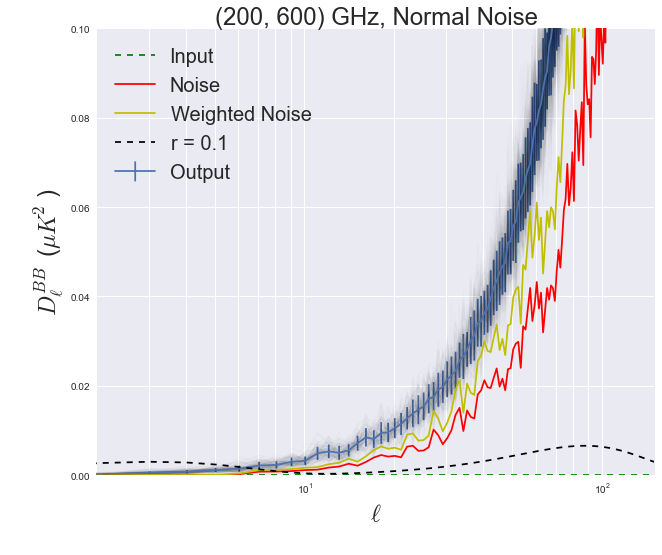

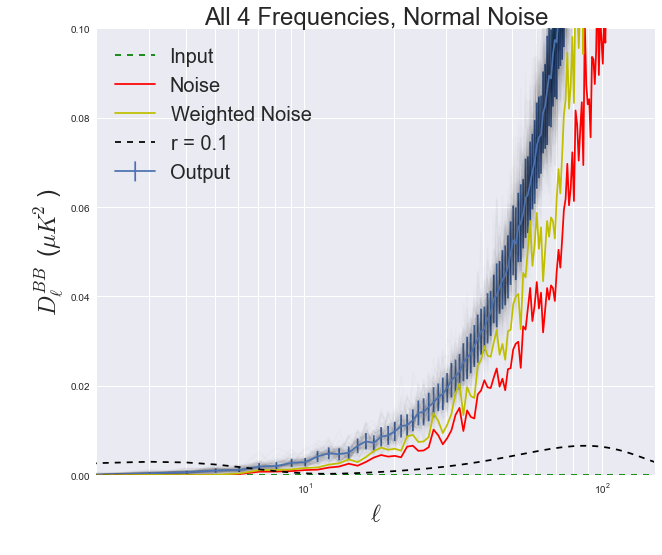

In [199]:
argdicts = {}
arglist = [('low_2', [200., 270.], 1., '(200, 270) GHz, Normal Noise'),
           ('all_4', [200., 270., 350., 600.], 1., 'All 4 Frequencies, Normal Noise'),
           ('low_high_2', [200., 600.], 1., '(200, 600) GHz, Normal Noise'),
           ('all_4_lownoise', [200., 270., 350., 600.], 0.1, 'All 4 Frequencies, Low Noise')]

for i in arglist:
    name, freqs, noisefact, label = i
    regnoise = np.array([noisedict[float(freq)] for freq in freqs])
    freqs = np.array(freqs)*1.e9
    argdict = baseargdict.copy()
    argdict.update({'freqs': freqs, 'regnoise': regnoise*noisefact, 'noisefactor': noisefact})
    toadd = {'label': label, 'args': argdict}
    argdicts[name] = toadd

for name, ad in argdicts.items():
    t0 = time.time()
#    print("Computing case: {0}".format(name))
#    cld = many_realizations(**(ad['args']))
#    results[name] = {'cldict': cld}
    cld = results[name]['cldict']
    nf = ad['args']['noisefactor']
    f = myplot(cld, name, ad['label'], nf)
    results[name]['figure'] = f
    tf = time.time()
#    print("Finished computing ({1} s): {0}".format(name, tf - t0))
#    print('-'*30)

In [25]:
results.keys()

['low_2', 'low_high_2', 'all_4']

In [134]:
def save_data(results, fname='results.pickle'):
    copydict = results.copy()
    for key in copydict.keys():
        del copydict[key]['figure']
    with open(fname, 'w') as f:
        pickle.dump(copydict, f)

save_data(results)
        
with open('results.pickle', 'r') as f:
    newresults = pickle.load(f)
    
newresults.k
#results

{'all_4': {'cldict': {'BB': array([[  0.00000000e+00,   0.00000000e+00,   1.10927848e-04, ...,
             1.28002212e-04,   1.26190556e-04,   1.30112182e-04],
          [  0.00000000e+00,   0.00000000e+00,   6.98910184e-05, ...,
             1.19857821e-04,   1.28158988e-04,   1.25698127e-04],
          [  0.00000000e+00,   0.00000000e+00,   2.14791197e-04, ...,
             1.18761402e-04,   1.20339676e-04,   1.17116768e-04],
          ..., 
          [  0.00000000e+00,   0.00000000e+00,   3.30133397e-04, ...,
             1.20306429e-04,   1.24181432e-04,   1.24175947e-04],
          [  0.00000000e+00,   0.00000000e+00,   3.93900239e-04, ...,
             1.17574703e-04,   1.19235089e-04,   1.22494882e-04],
          [  0.00000000e+00,   0.00000000e+00,   1.75447753e-04, ...,
             1.18423398e-04,   1.21951409e-04,   1.28853495e-04]]),
   'BB_mean': array([ 0.        ,  0.        ,  0.0002477 , ...,  0.00012041,
           0.00012335,  0.00012354]),
   'BB_std': array([  0.0

In [184]:
#nms = cldict_normal_test['noisemaps'][:, 0, :]
#noisecls = np.array([hp.anafast(nm) for nm in nms])
print(noisecls.mean(axis=1)/noisecls.mean(axis=1)[0])
print((regnoise/regnoise[0])**2)

[  1.00000000e+00   2.13424501e+00   2.65486713e+01   7.17723346e+03]
[  1.00000000e+00   2.13609467e+00   2.65621302e+01   7.15976331e+03]


(0.0, 10)

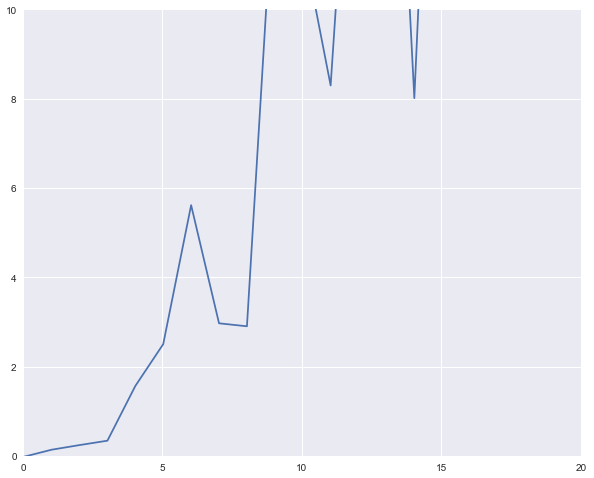

In [160]:
noisecls = hp.anafast(cldict_normal_test['noisemap'][0])
noiseells = np.arange(len(noisecls))
noiseprefix = noiseells*(noiseells + 1)/(2*np.pi)
plot(noiseells, noiseprefix*noisecls)
xlim(xmax=20)
ylim(ymax=10)

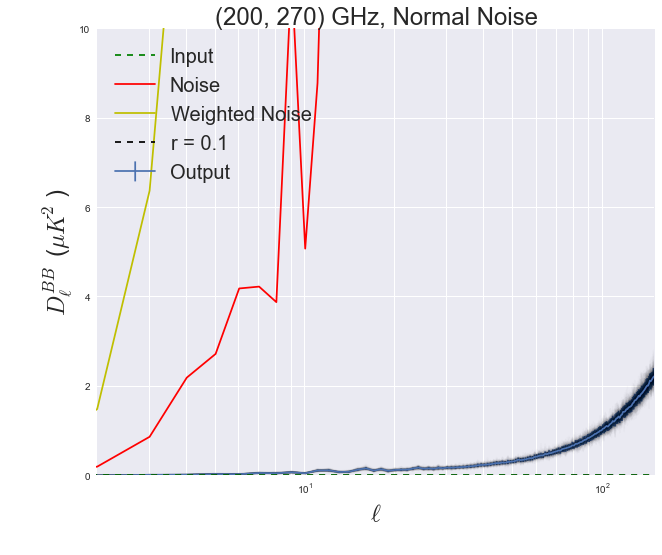

In [146]:
f = results['low_2']['figure']
ax = f.get_axes()[0]
ax.set_ylim(ymax=10)
f

In [25]:
N=100
freqs = np.array([200., 270.])*1.e9

Omega_single = 7.45446e-6  # sr, from bjohnson report
Omega_pixel = hp.nside2pixarea(512)  # pixel solid angle in sr
Omega_array = 9.54171e-3  # sr, from bjohnson report
regnoise = 3.*np.sqrt(Omega_single/Omega_pixel)  # uK/pixel
fname = 'junk/explanatory_cl.dat'
lensed = False
noisefactor = False

cldict_normal_test = calculations.ilc_foreground_cleaning.polarized_ilc_reconstruction(freqs, fname=fname, regnoise=regnoise,
                                      lensed=lensed, noisefactor=noisefactor)

--------------------------------------------------------------------------------
Performing ILC simulation with frequencies: [ 200.  270.] GHz
Constructing CMB temperature and polarization maps.
Loaded dust from file: /Users/jlazear/github/cmb/data/dust.npy
Combining maps.
Instrument/regularization noise with std dev 4.09812311319 uK
Performing ILC on Q/U maps separately.
Reconstructing ILC Q/U maps.
Computing C_l's from reconstructed maps.
Done with ILC with frequencies [ 200.  270.] GHz!
--------------------------------------------------------------------------------


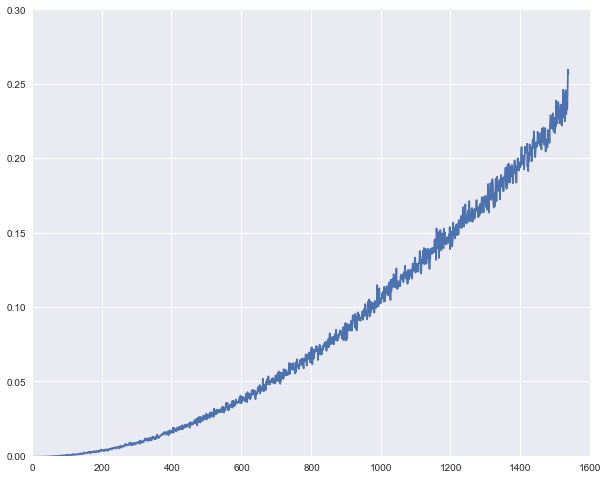

In [131]:
noisemap = cldict_normal_test['noisemap']
cls_noise_low = hp.anafast([noisemap, noisemap, noisemap])
labels = ['TT', 'EE', 'BB', 'TE', 'EB', 'TB']
cldict_noise_low = {labels[i]: cls_noise_low[i] for i in range(len(labels))}
cldict_noise_low['ell'] = np.arange(len(cldict_noise_low['TT']), dtype='float')

prefix_noise_low = cldict_noise_low['ell']*(cldict_noise_low['ell'] + 1)/(2*np.pi)
plot(cldict_noise_low['ell'], prefix_noise_low*cldict_noise_low['BB'])

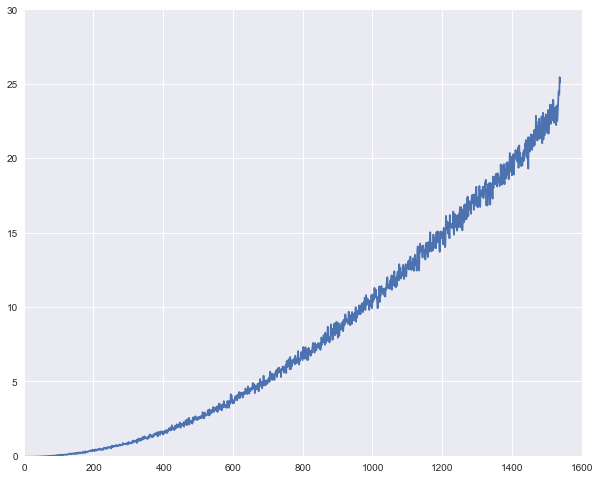

In [29]:
noisemap = cldict_normal_test['noisemap'][0]
cls_noise = hp.anafast([noisemap, noisemap, noisemap])
labels = ['TT', 'EE', 'BB', 'TE', 'EB', 'TB']
cldict_noise = {labels[i]: cls_noise[i] for i in range(len(labels))}
cldict_noise['ell'] = np.arange(len(cldict_noise['TT']), dtype='float')

prefix_noise = cldict_noise['ell']*(cldict_noise['ell'] + 1)/(2*np.pi)
plot(cldict_noise['ell'], prefix_noise*cldict_noise['BB'])

NameError: name 'cldict_noise_low' is not defined

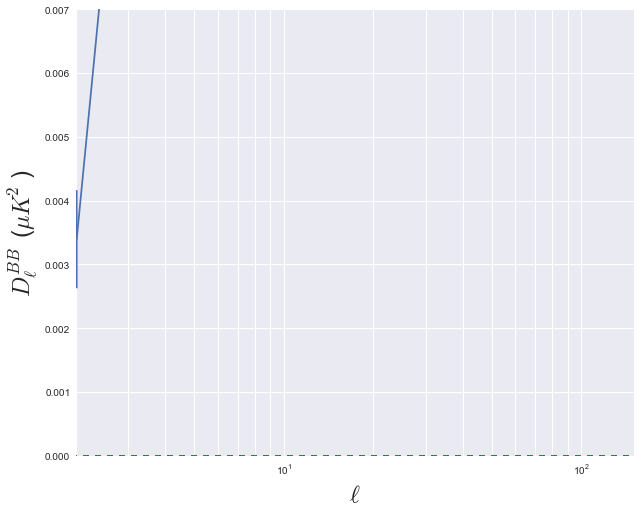

In [59]:
cld = cldict_low
ell = cld['ell']
prefix = ell*(ell+1)/(2*np.pi)
# for bb in cld['BB']:
#     plot(ell, prefix*bb, 'k-', alpha=.015)

# plot(ell, prefix*bbmean, 'b-')
# errorbar(ell, prefix*bbmean, fmt=None, yerr=prefix*bbstd, color='b')
bbmean = cld['BB_mean']
bbstd = cld['BB_std']
errorbar(ell, prefix*bbmean, yerr=prefix*bbstd, label='Output')
plot(ell, 0*ell, 'g--', label='Input')

nmax = where(ell<20.)[0][-1]
# bbmax = prefix[nmax]*(bbmean[nmax] + 5*bbstd[nmax])*2
bbmax = 0.007
# ylim(ymax=bbmax)
ylim([0, bbmax])
# xlim(xmin=2, xmax=20)
xlim(xmin=2, xmax=150)
xscale('log')

xlabel(r'$\ell$', fontsize=24)
ylabel(r'$D_\ell^{BB}$ ($\mu K^2$)', fontsize=24)

ell0p1 = cl0p1dict['ell']
bb0p1 = cl0p1dict['BB']
prefix = ell0p1*(ell0p1 + 1)/(2*np.pi)

prefix_noise_low = cldict_noise_low['ell']*(cldict_noise_low['ell'] + 1)/(2*np.pi)
plot(cldict_noise_low['ell'], prefix_noise_low*cldict_noise_low['BB'], 'r-', label='Noise')
plot(ell0p1, prefix*bb0p1, 'k--', label='r = 0.1')
legend(loc='upper left', fontsize=20)
title('Pixel Noise = PIPER/10 = 0.4 uK/pixel')
savefig('low_noise.png', dpi=150)

In [89]:
nf = np.sqrt(np.sum(np.abs(cldict_normal_test['weights_Q'])**2))

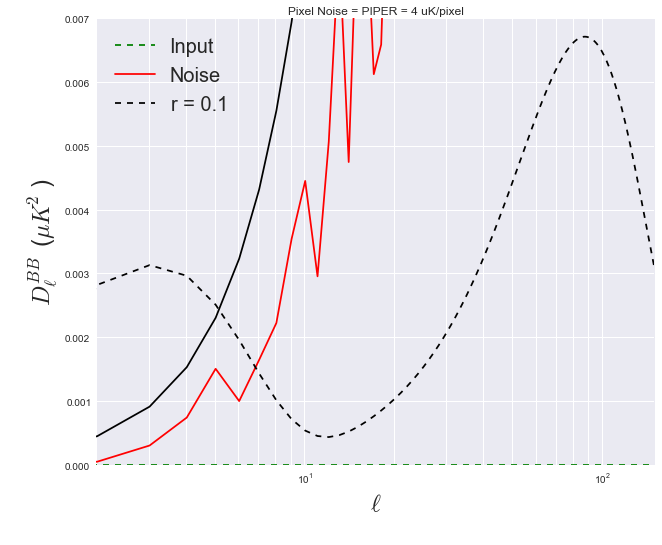

In [90]:
cld = cldict_normal_test['cl_out']
ell = cld['ell']
prefix = ell*(ell+1)/(2*np.pi)
# for bb in cld['BB']:
plot(ell, prefix*bb, 'k-', alpha=1)

# plot(ell, prefix*bbmean, 'b-')
# errorbar(ell, prefix*bbmean, fmt=None, yerr=prefix*bbstd, color='b')
# bbmean = cld['BB_mean']
# bbstd = cld['BB_std']
# errorbar(ell, prefix*bbmean, yerr=prefix*bbstd, label='Output')
plot(ell, 0*ell, 'g--', label='Input')

prefix_noise = cldict_noise['ell']*(cldict_noise['ell'] + 1)/(2*np.pi)
plot(cldict_noise['ell'], nf*prefix_noise*cldict_noise['BB'], 'r-', label='Noise')

nmax = where(ell<20.)[0][-1]
# bbmax = prefix[nmax]*(bbmean[nmax] + 5*bbstd[nmax])*2
bbmax = 0.007
# ylim(ymax=bbmax)
ylim([0, bbmax])
# xlim(xmin=2, xmax=20)
xlim(xmin=2, xmax=150)
xscale('log')

xlabel(r'$\ell$', fontsize=24)
ylabel(r'$D_\ell^{BB}$ ($\mu K^2$)', fontsize=24)

ell0p1 = cl0p1dict['ell']
bb0p1 = cl0p1dict['BB']
prefix = ell0p1*(ell0p1 + 1)/(2*np.pi)

plot(ell0p1, prefix*bb0p1, 'k--', label='r = 0.1')
legend(loc='upper left', fontsize=20)
title('Pixel Noise = PIPER = 4 uK/pixel')
# savefig('piper_noise.png', dpi=150)

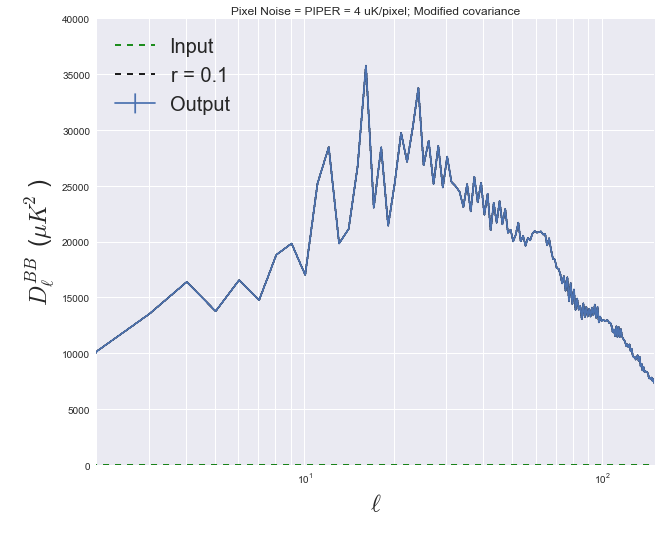

In [104]:
cld = cldict_normal_mod
ell = cld['ell']
prefix = ell*(ell+1)/(2*np.pi)
for bb in cld['BB']:
    plot(ell, prefix*bb, 'k-', alpha=.015)

# plot(ell, prefix*bbmean, 'b-')
# errorbar(ell, prefix*bbmean, fmt=None, yerr=prefix*bbstd, color='b')
bbmean = cld['BB_mean']
bbstd = cld['BB_std']
errorbar(ell, prefix*bbmean, yerr=prefix*bbstd, label='Output')
plot(ell, 0*ell, 'g--', label='Input')

nmax = where(ell<20.)[0][-1]
# bbmax = prefix[nmax]*(bbmean[nmax] + 5*bbstd[nmax])*2
bbmax = 0.007
# ylim(ymax=bbmax)
# ylim([0, bbmax])
# xlim(xmin=2, xmax=20)
xlim(xmin=2, xmax=150)
xscale('log')

xlabel(r'$\ell$', fontsize=24)
ylabel(r'$D_\ell^{BB}$ ($\mu K^2$)', fontsize=24)

ell0p1 = cl0p1dict['ell']
bb0p1 = cl0p1dict['BB']
prefix = ell0p1*(ell0p1 + 1)/(2*np.pi)

plot(ell0p1, prefix*bb0p1, 'k--', label='r = 0.1')
legend(loc='upper left', fontsize=20)
title('Pixel Noise = PIPER = 4 uK/pixel; Modified covariance')
savefig('piper_noise_mod.png', dpi=150)

(0.0, 0.0002)

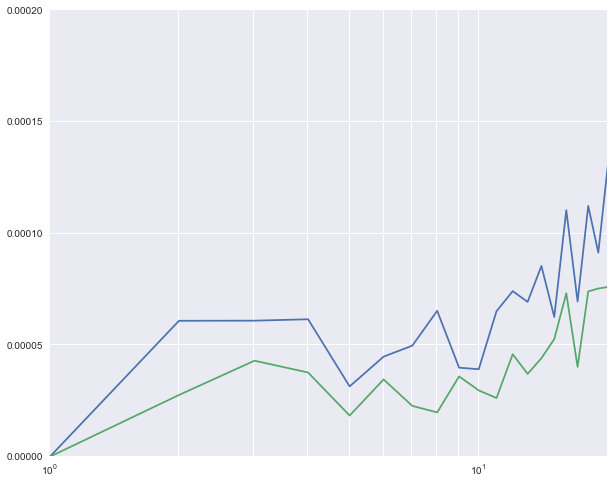

In [1259]:
for bb in cldict['BB']:
    ell = cldict['ell']
    plot(ell, ell*(ell+1)/(2*np.pi)*bb)

xscale('log')
xlim(xmax=20)
ylim(ymax=.0002)

In [1243]:
reload(calculations.ilc_foreground_cleaning)
import calculations

freqs2 = np.array([200., 270.])*1.e9
freqs4 = np.array([200., 270., 350., 600.])*1.e9
freqs14 = np.array([200., 600.])*1.e9

Omega_single = 7.45446e-6  # sr, from bjohnson report
Omega_pixel = hp.nside2pixarea(512)  # pixel solid angle in sr
Omega_array = 9.54171e-3  # sr, from bjohnson report
regnoise = 3.*np.sqrt(Omega_single/Omega_pixel)/10.  # uK/pixel
print "pixel noise = {0} uK".format(regnoise)

nf = False
retdict2 = calculations.ilc_foreground_cleaning.polarized_ilc_reconstruction(freqs2, _debug=True,
                 fname='junk/explanatory_cl.dat', lensed=False, regnoise=regnoise, noisefactor=nf)
retdict4 = calculations.ilc_foreground_cleaning.polarized_ilc_reconstruction(freqs4, _debug=True,
                 fname='junk/explanatory_cl.dat', lensed=False, regnoise=regnoise, noisefactor=nf)
retdict14 = calculations.ilc_foreground_cleaning.polarized_ilc_reconstruction(freqs14, _debug=True,
                 fname='junk/explanatory_cl.dat', lensed=False, regnoise=regnoise, noisefactor=nf)
print '-'*30, 'ALL DONE', '-'*30

pixel noise = 0.409812311319 uK
--------------------------------------------------------------------------------
Performing ILC simulation with frequencies: [ 200.  270.] GHz
Constructing CMB temperature and polarization maps.
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Loaded dust from file: /Users/jlazear/github/cmb/data/dust.npy
Combining maps.
Instrument/regularization noise with std dev 0.409812311319 uK
Performing ILC on Q/U maps separately.
Reconstructing ILC Q/U maps.
Computing C_l's from reconstructed maps.
Performing analytical ILC simulation in foreground/background space
Done with ILC with frequencies [ 200.  270.] GHz!
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Performing ILC simulation with frequencies: [ 200.  270.  350.  600.] GHz
Constructing CMB temperature and polarization maps.
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm

(2, 3145728)
(2, 2, 3145728)
(3145728,)
0.0677824099768 4.25970807387 0.00240170311916
-0.000690470076247 0.409825854064 0.00023106748513


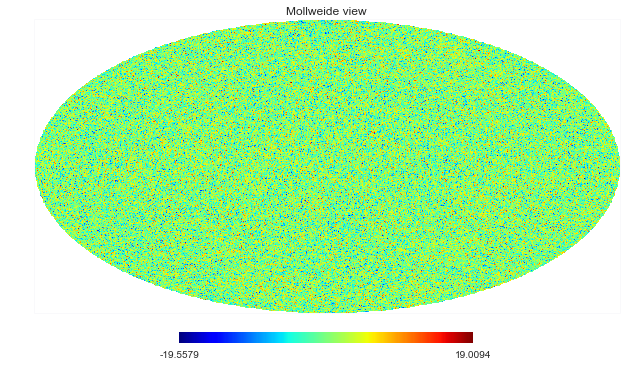

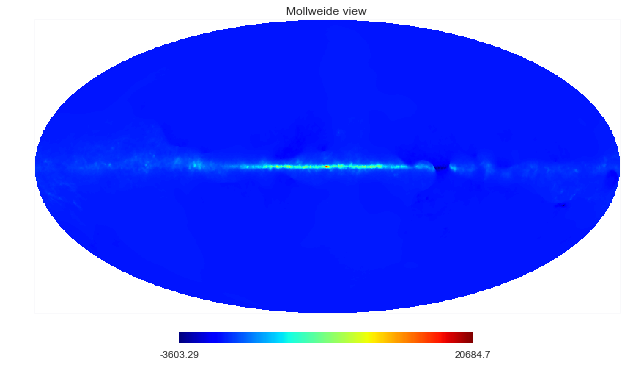

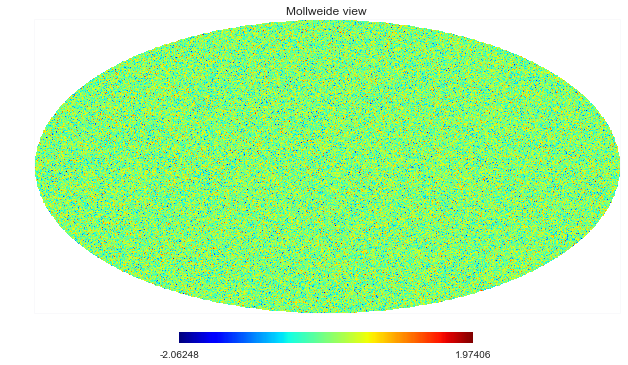

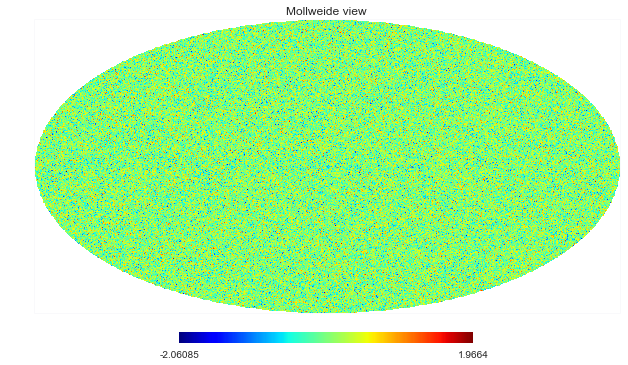

In [1244]:
rdict = retdict2
cmbQUmaps = rdict['cmbQUmaps']
dustmaps = rdict['dustmaps']
noisemap = rdict['noisemap']
ilcQmap = rdict['ilcQmap']

hp.mollview(cmbQUmaps[0])
hp.mollview(dustmaps[0][0])
hp.mollview(noisemap)
hp.mollview(ilcQmap - cmbQUmaps[0])
print cmbQUmaps.shape
print dustmaps.shape
print noisemap.shape

print np.mean(cmbQUmaps[0]), np.std(cmbQUmaps[0]), np.std(cmbQUmaps[0])/np.sqrt(len(noisemap) - 1)
print np.mean(noisemap), np.std(noisemap), np.std(noisemap)/np.sqrt(len(noisemap) - 1)

frequencies = [ 200.  270.] GHz
Q weights          = [ 2.34771765 -1.34771765]
Q weights expected = [ 2.84933324 -1.84933324]
log10(Q condition number) = 9.31228278679
var(ILC Q)          = 34.9654529043
var(ILC Q) expected = 30307.0632065
U weights          = [ 2.3475355 -1.3475355]
U weights expected = [ 2.04436231 -1.04436231]
log10(U condition number) = 11.266231145
var(ILC U)          = 34.8920765989
var(ILC U) expected = 1797.5338851


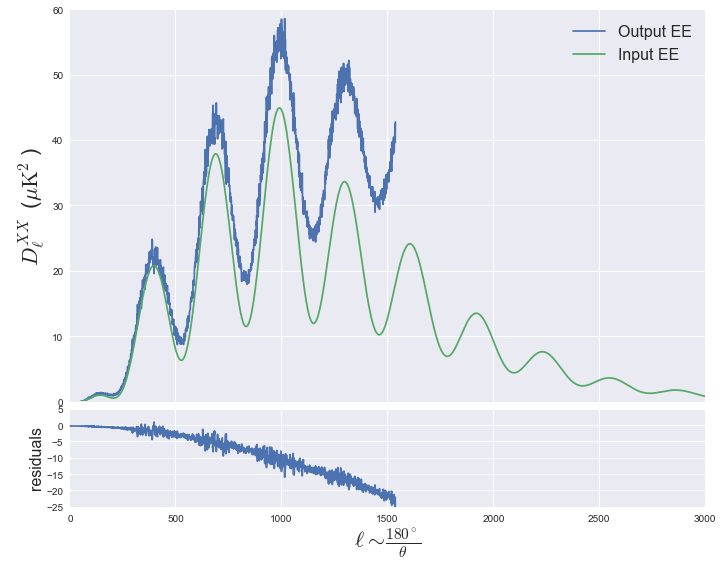

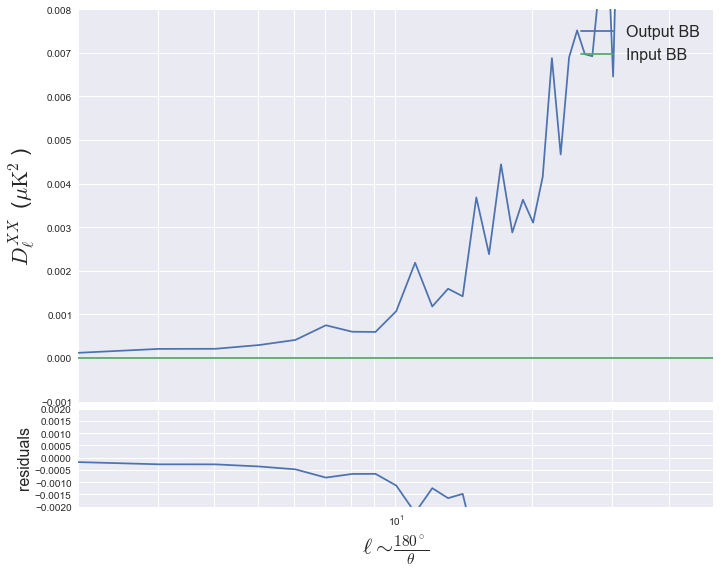

In [1242]:
rdict = retdict2
cl_in = rdict['cl_in']
cl_out = rdict['cl_out']

xxs = ['EE', 'BB']  # Available: ['TT', 'EE', 'TE', 'BB']
figs = {}
axes = {}
for xx in xxs:
    f, a = util.plot_funcs.Dl_resid_plot(cl_out['ell'], cl_out[xx], cl_in['ell'], cl_in[xx],
                                         label1='Output {0}'.format(xx),
                                         label2='Input {0}'.format(xx))
    figs[xx] = f
    axes[xx] = a

try:
    axesBB = axes['BB']
    axesBB[0].set_xlim([2, 50])
    axesBB[1].set_xlim([2, 50])
    axesBB[0].set_ylim([-0.001,.008])
#     axesBB[1].set_ylim([-.1,.1])
    axesBB[1].set_ylim([-.002,.002])
    axesBB[0].set_xscale('log')
    axesBB[1].set_xscale('log')
except KeyError:
    pass

util.plot_funcs.print_summary(rdict)

frequencies = [ 200.  270.] GHz
Q weights          = [ 2.34769091 -1.34769091]
Q weights expected = [ 2.63847333 -1.63847333]
log10(Q condition number) = 9.12629454212
var(ILC Q)          = 18.313651587
var(ILC Q) expected = 10191.0258483
U weights          = [ 2.34762116 -1.34762116]
U weights expected = [ 2.26804996 -1.26804996]
log10(U condition number) = 10.6217093567
var(ILC U)          = 18.2982360384
var(ILC U) expected = 139.719364522


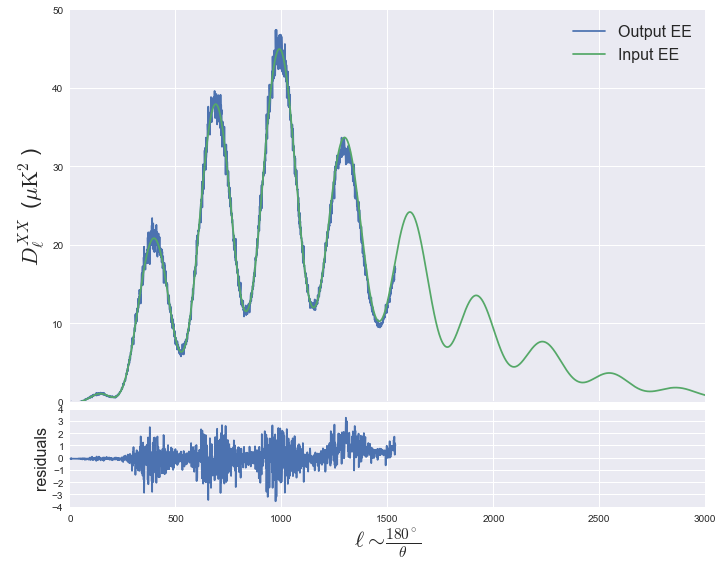

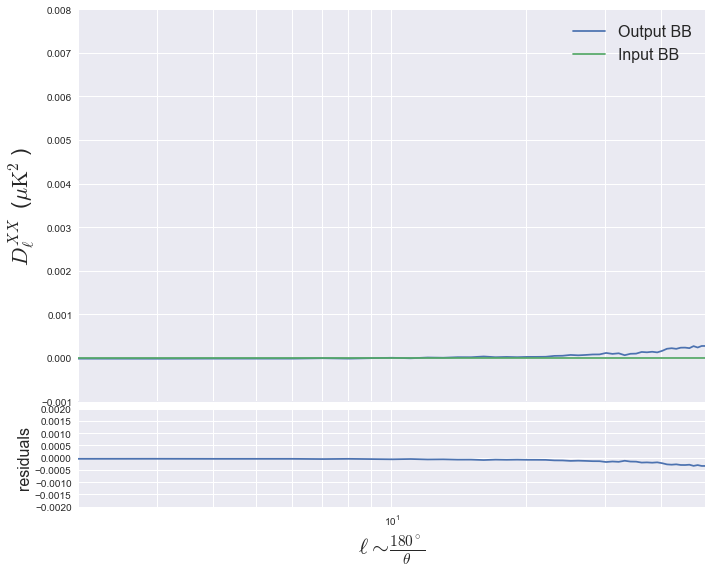

In [1245]:
rdict = retdict2
cl_in = rdict['cl_in']
cl_out = rdict['cl_out']

xxs = ['EE', 'BB']  # Available: ['TT', 'EE', 'TE', 'BB']
figs = {}
axes = {}
for xx in xxs:
    f, a = util.plot_funcs.Dl_resid_plot(cl_out['ell'], cl_out[xx], cl_in['ell'], cl_in[xx],
                                         label1='Output {0}'.format(xx),
                                         label2='Input {0}'.format(xx))
    figs[xx] = f
    axes[xx] = a

try:
    axesBB = axes['BB']
    axesBB[0].set_xlim([2, 50])
    axesBB[1].set_xlim([2, 50])
    axesBB[0].set_ylim([-0.001,.008])
#     axesBB[1].set_ylim([-.1,.1])
    axesBB[1].set_ylim([-.002,.002])
    axesBB[0].set_xscale('log')
    axesBB[1].set_xscale('log')
except KeyError:
    pass

util.plot_funcs.print_summary(rdict)

frequencies = [ 200.  270.  350.  600.] GHz
Q weights          = [ 0.5  0.5]
Q weights expected = [ 2.913994 -1.913994]
log10(Q condition number) = 9.20307105801
var(ILC Q)          = 34.9322660896
var(ILC Q) expected = 34.9322660245
U weights          = [ 0.5  0.5]
U weights expected = [ 2.31382355 -1.31382355]
log10(U condition number) = 10.1098003801
var(ILC U)          = 35.0413982038
var(ILC U) expected = 35.0413982038


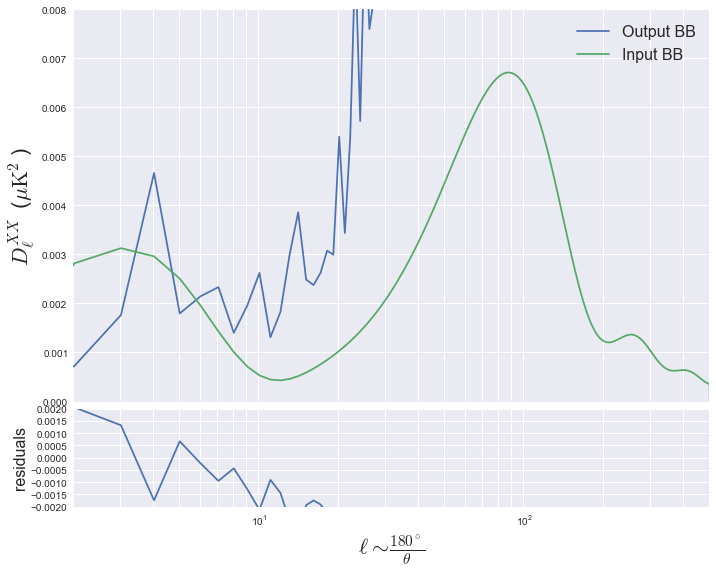

In [1156]:
rdict = retdict4
cl_in = rdict['cl_in']
cl_out = rdict['cl_out']

xxs = ['BB']  # Available: ['TT', 'EE', 'TE', 'BB']
figs = {}
axes = {}
for xx in xxs:
    f, a = util.plot_funcs.Dl_resid_plot(cl_out['ell'], cl_out[xx], cl_in['ell'], cl_in[xx],
                                         label1='Output {0}'.format(xx),
                                         label2='Input {0}'.format(xx))
    figs[xx] = f
    axes[xx] = a

try:
    axesBB = axes['BB']
    axesBB[0].set_xlim([2, 500])
    axesBB[1].set_xlim([2, 500])
    axesBB[0].set_ylim([0,.008])
    axesBB[1].set_ylim([-.002,.002])
    axesBB[0].set_xscale('log')
    axesBB[1].set_xscale('log')
except KeyError:
    pass

util.plot_funcs.print_summary(rdict)

frequencies = [ 200.  600.] GHz
Q weights          = [ 1.01161714 -0.01161714]
Q weights expected = [ 1.00638745 -0.00638745]
log10(Q condition number) = 11.4642386639
var(ILC Q)          = 18.1563461245
var(ILC Q) expected = 44295.6164144
U weights          = [ 1.01161754 -0.01161754]
U weights expected = [ 1.01149118 -0.01149118]
log10(U condition number) = 12.4831330348
var(ILC U)          = 18.1584997828
var(ILC U) expected = 22.2784486219


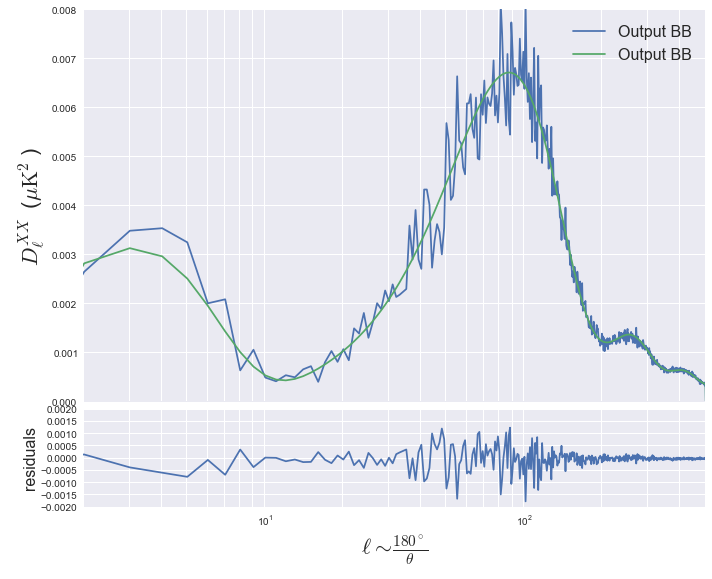

In [667]:
rdict = retdict14
cl_in = rdict['cl_in']
cl_out = rdict['cl_out']

xxs = ['BB']  # Available: ['TT', 'EE', 'TE', 'BB']
figs = {}
axes = {}
for xx in xxs:
    f, a = util.plot_funcs.Dl_resid_plot(cl_out['ell'], cl_out[xx], cl_in['ell'], cl_in[xx],
                                         label1='Output {0}'.format(xx),
                                         label2='Input {0}'.format(xx))
    figs[xx] = f
    axes[xx] = a

try:
    axesBB = axes['BB']
    axesBB[0].set_xlim([2, 500])
    axesBB[1].set_xlim([2, 500])
    axesBB[0].set_ylim([0,.008])
    axesBB[1].set_ylim([-.002,.002])
    axesBB[0].set_xscale('log')
    axesBB[1].set_xscale('log')
except KeyError:
    pass

util.plot_funcs.print_summary(rdict)

## Checking the function for errors...

In [90]:
#     frequencies = np.array(frequencies)

#     # Construct CMB maps from spectra
#     (Tmap, Qmap, Umap), cldict = lib.cmb.generate_maps(Nside=Nside,
#                         n2r=True, return_cls=True, fname=fname, lensed=lensed)
#     cmbQUmaps = np.vstack([Qmap, Umap])  # uK

#     # 3 deg smoothed QU polarized synchrotron-tracking dust maps
#     MJypsr = lib.conversions.MJypsr
#     convs = [1.e6/(lib.conversions.dBdT(f)/MJypsr)  # uK_CMB/(MJy/sr)
#              for f in frequencies]

#     dustmaps = [lib.foregrounds.generate_synchro_traced_dust_QU_map(nu=nu,
#                         Nside=Nside,  n2r=True, sigma=3.*np.pi/180)
#                 for nu in frequencies]
#     dustmaps = [dustmaps[i]*convs[i] for i in range(len(dustmaps))]   # uK_CMB

#     # Construct CMB + foreground maps
#     totalQUmaps = [cmbQUmaps + dustmap for dustmap in dustmaps]

#     # Perform ILC on each set of Q and U maps
#     #
#     # # Get WMAP masks and regions
#     # maskdata = 'data/wmap_ilc_rgn_defn_9yr_v5.fits'
#     # masks, region = load_wmap_masks(maskdata)
#     # ws = compute_ilc_weights(maps, masks)

#     totalQmaps = np.vstack([totalQUmaps[i][0] for i in range(len(totalQUmaps))])
#     totalUmaps = np.vstack([totalQUmaps[i][1] for i in range(len(totalQUmaps))])

#     Qweights = lib.ilc.compute_ilc_weights(totalQmaps)
#     Uweights = lib.ilc.compute_ilc_weights(totalUmaps)

#     ilcQmap = np.dot(Qweights, totalQmaps)
#     ilcUmap = np.dot(Uweights, totalUmaps)

#     recon_cls = hp.anafast([Tmap, ilcQmap, ilcUmap])  # TT, EE,  BB, TE, EB, TB
#     labels = ['TT', 'EE', 'BB', 'TE', 'EB', 'TB']
#     recon_cldict = {labels[i]: recon_cls[i] for i in range(len(labels))}
#     recon_cldict['ell'] = np.arange(len(recon_cldict['TT']), dtype='float')
    
#     retdict = {'cl_in': cldict, 'cl_out': recon_cldict,
#                'cmbTmap': Tmap, 'cmbQUmaps': cmbQUmaps, 'dustmaps': dustmaps,
#                'totalQUmaps': totalQUmaps,
#                'weights_Q': Qweights, 'weights_U': Uweights,
#                'ilcQmap': ilcQmap, 'ilcUmap': ilcUmap}

#     return retdict

Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
(2, 3145728)


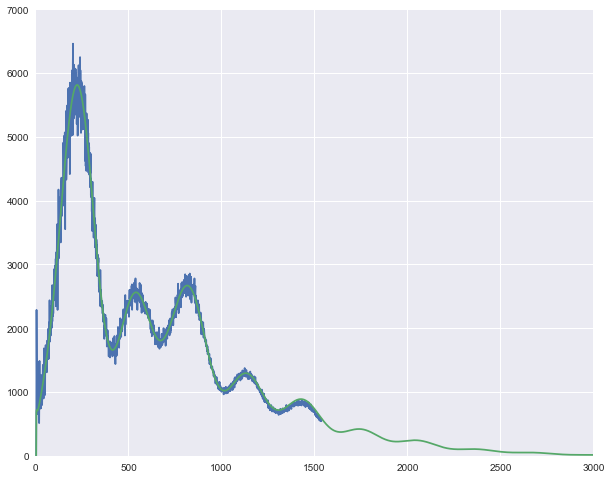

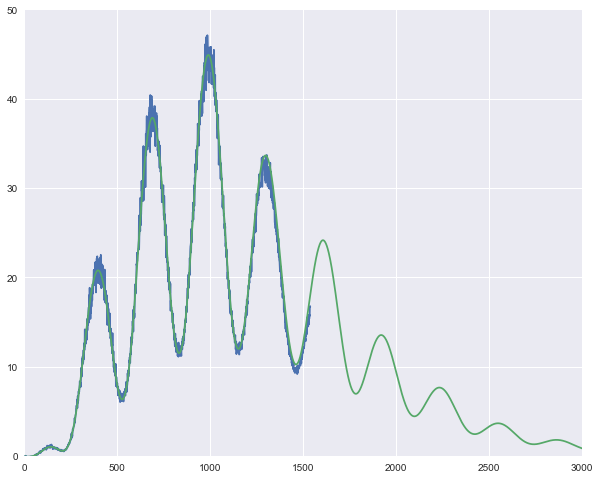

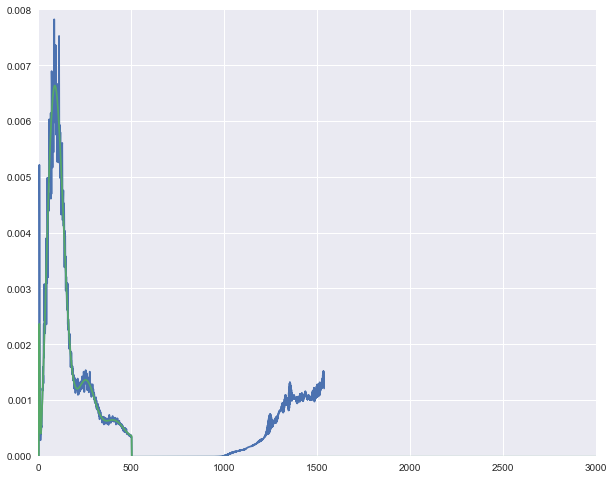

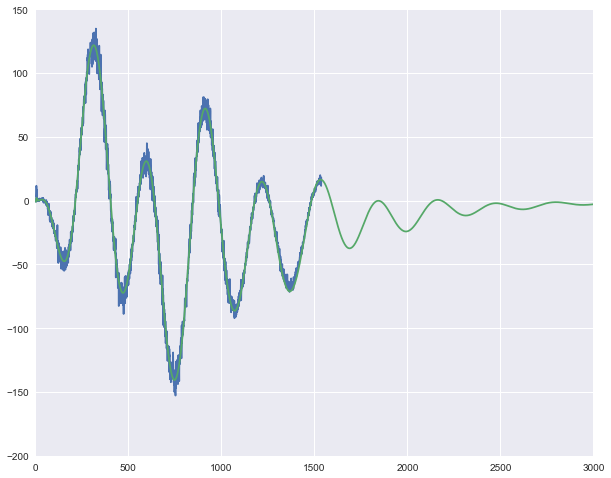

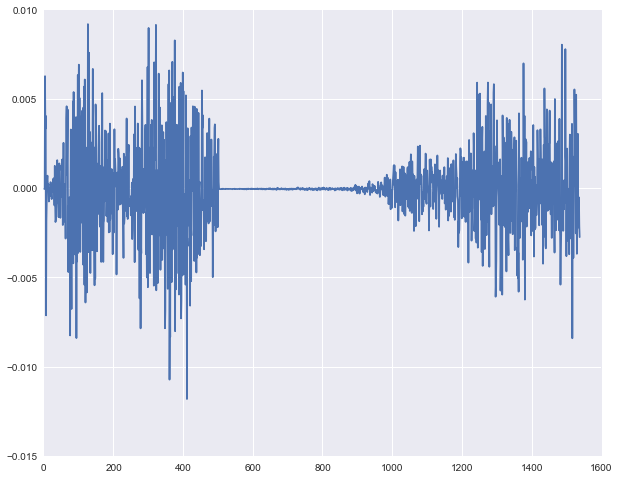

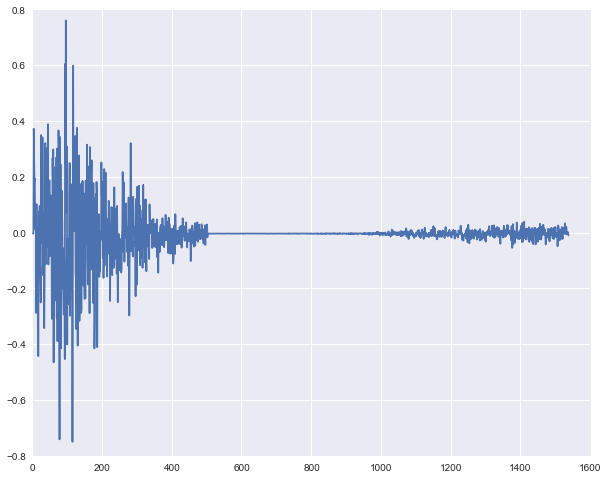

In [414]:
#     # Construct CMB maps from spectra
#     (Tmap, Qmap, Umap), cldict = lib.cmb.generate_maps(Nside=Nside,
#                         n2r=True, return_cls=True, fname=fname, lensed=lensed)
#     cmbQUmaps = np.vstack([Qmap, Umap])  # uK


# Testing this line
(Tmap, Qmap, Umap), cldict = lib.cmb.generate_maps(fname='junk/explanatory_cl.dat', 
                                                   lensed=False, return_cls=True, n2r=True)
cmbQUmaps = np.vstack([Qmap, Umap])  # uK


# Verify that the generated maps are sensible and match the input spectra
results = hp.anafast([Tmap, Qmap, Umap])
ells = np.arange(len(results[0]))

xxs = ['TT', 'EE', 'BB', 'TE', 'EB', 'TB']

for i, result in enumerate(results):
    xx = xxs[i]
    figure()
    plot(ells, ells*(ells+1)*result/(2*np.pi))
    eo = cldict['ell']
    f = eo*eo/(2*np.pi)
    try:
        plot(eo, f*cldict[xx])
    except KeyError:
        pass
    
print np.shape(cmbQUmaps)

freq = 200.0 GHz, factor = 0.40291038777
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
freq = 270.0 GHz, factor = 0.651242138951
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
(1, 0)
80.5932044722 467.446556851
(1, 0)
4.87127159843 186.626355317
(1, 0)
140.395339567 814.303371066
(1, 0)
8.48587461593 325.107689722
(2, 2, 3145728)


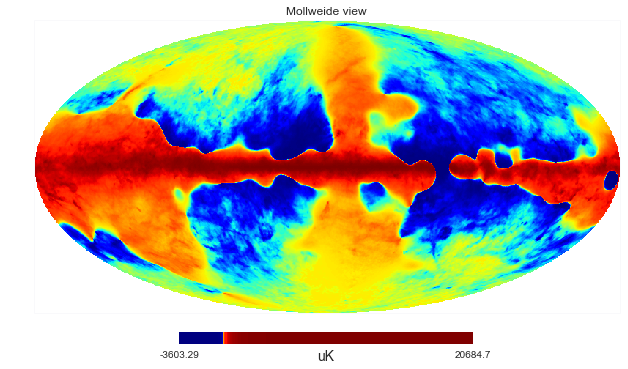

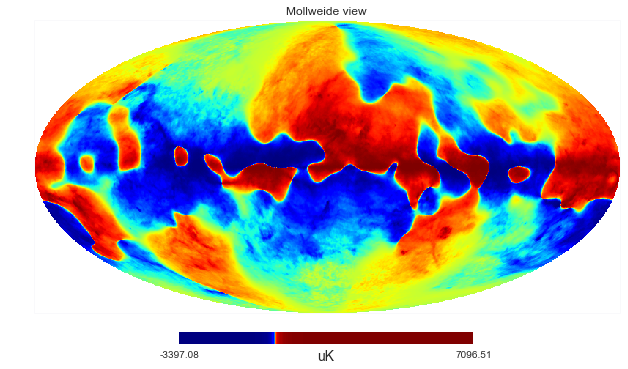

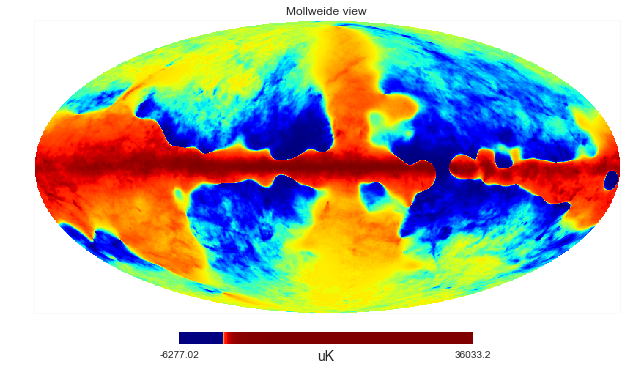

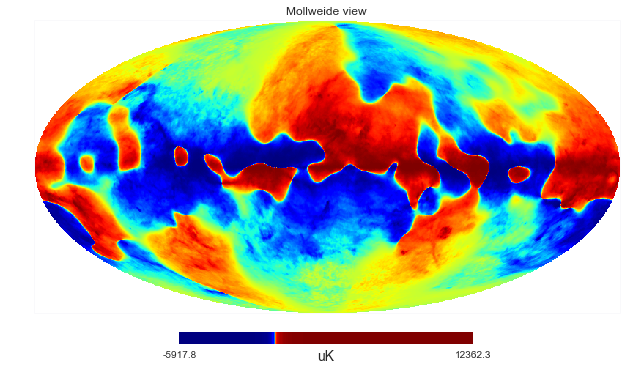

In [524]:
#     # 3 deg smoothed QU polarized synchrotron-tracking dust maps
#     MJypsr = lib.conversions.MJypsr
#     convs = [1.e6/(lib.conversions.dBdT(f)/MJypsr)  # uK_CMB/(MJy/sr)
#              for f in frequencies]

#     dustmaps = [lib.foregrounds.generate_synchro_traced_dust_QU_map(nu=nu,
#                         Nside=Nside,  n2r=True, sigma=3.*np.pi/180)
#                 for nu in frequencies]
#     dustmaps = [dustmaps[i]*convs[i] for i in range(len(dustmaps))]   # uK_CMB

    # 3 deg smoothed QU polarized synchrotron-tracking dust maps
frequencies = np.array([200.,270.,])*1.e9  # Hz
MJypsr = lib.conversions.MJypsr
convs = [1.e6/(lib.conversions.dBdT(f)/MJypsr)  # uK_CMB/(MJy/sr)
         for f in frequencies]

dustmaps = [lib.foregrounds.generate_synchro_traced_dust_QU_map(nu=nu, n2r=True, sigma=3.*np.pi/180,
                                                                Nside=512)
            for nu in frequencies]  # in MJy/sr

lefthalf = where(hp.pix2ang(512, arange(len(dm)))[1] >= np.pi)

for i in range(len(dustmaps)):
    for j in range(len(dustmaps[0])):
        dustmaps[i][j][lefthalf] *= 1#.5#*(i+1)

dustmaps = [dustmaps[i]*convs[i] for i in range(len(dustmaps))]   # MJy/sr -> uK_CMB

for i in range(len(dustmaps)):
    dustmap = dustmaps[i]
    for j in range(len(dustmap)):
        d = dustmaps[i][j]# /dustmaps[2][j]
        hp.mollview(d, norm='hist', unit='uK')
        print np.shape(where(np.isnan(d)))
        d2 = d[np.where(~np.isnan(d))[0]]
        print np.mean(d2), np.std(d2)
        
print np.shape(dustmaps)

In [525]:
def naninfmean(d):
    return np.mean(notnaninf(d))

def notnaninf(d):
    d2 = d[~np.isnan(d)]
    d3 = d2[~np.isinf(d2)]
    return d3

# beta = 1.6
# (frequencies/353.e9)**beta

meanfracs = [[], []]
for i in range(len(dustmaps)):
    for j in range(len(cmbQUmaps)):
        dm = np.abs(dustmaps[i][j])
        cm = np.abs(cmbQUmaps[j])
        mf = dm.mean()/cm.mean()
        meanfracs[j].append(mf)
        print "mean fraction = ", mf

meanfracs = np.array(meanfracs)        
        
for i, meanfrac in enumerate(meanfracs):
    print "meanfrac[{0}] = ".format(i), meanfrac

for meanfrac in meanfracs:
    print 1/(meanfrac/meanfrac.min())
        
# dm = np.abs(dustmaps[0][0])
# cm = np.abs(cmbQUmaps[0])
# print dm.mean(), dm.std()
# print cm.mean(), cm.std()
# hist(dm, log=True)
# figure()
# hist(cm, log=True)

mean fraction =  37.6169648036
mean fraction =  18.8981144476
mean fraction =  65.529675625
mean fraction =  32.9209790253
meanfrac[0] =  [ 37.6169648   65.52967563]
meanfrac[1] =  [ 18.89811445  32.92097903]
[ 1.          0.57404473]
[ 1.          0.57404473]


In [526]:
#     # Construct CMB + foreground maps
#     totalQUmaps = [cmbQUmaps + dustmap for dustmap in dustmaps]

totalQUmaps = [cmbQUmaps + dustmap for dustmap in dustmaps]
np.shape(totalQUmaps)

# Try for various combinations of indices... Matching indices should give ~0 maps,
# others should give maps that look like the odd component out. 
# They all seem fine...
# hp.mollview((totalQUmaps[2][0] - dustmaps[2][0]) - cmbQUmaps[0], norm='hist')

(2, 2, 3145728)

In [527]:
#     # Perform ILC on each set of Q and U maps
#     #
#     # # Get WMAP masks and regions
#     # maskdata = 'data/wmap_ilc_rgn_defn_9yr_v5.fits'
#     # masks, region = load_wmap_masks(maskdata)
#     # ws = compute_ilc_weights(maps, masks)

#     totalQmaps = np.vstack([totalQUmaps[i][0] for i in range(len(totalQUmaps))])
#     totalUmaps = np.vstack([totalQUmaps[i][1] for i in range(len(totalQUmaps))])

totalQmaps = np.vstack([totalQUmaps[i][0] for i in range(len(totalQUmaps))])
totalUmaps = np.vstack([totalQUmaps[i][1] for i in range(len(totalQUmaps))])

print np.shape(totalQmaps), "should be (4, 3145728)"
print np.shape(totalUmaps), "should be (4, 3145728)"

# Just checking that we re-grouped the maps correctly. Should all be True.
print [np.std(totalQmaps[i] - totalQUmaps[i][0]) == 0. for i in range(len(totalQmaps))]
print [np.std(totalUmaps[i] - totalQUmaps[i][1]) == 0. for i in range(len(totalUmaps))]

# Cross-checking the maps. Should all be non-zero.
print [np.std(totalQmaps[i] - totalQUmaps[i][1]) for i in range(len(totalQmaps))]
print [np.std(totalUmaps[i] - totalQUmaps[i][0]) for i in range(len(totalUmaps))]

(2, 3145728) should be (4, 3145728)
(2, 3145728) should be (4, 3145728)
[True, True]
[True, True]
[454.45839079957824, 791.64635836094124]
[454.45839079957824, 791.64635836094124]


[ 200.  270.]
[ 2.3476266 -1.3476266]
[ 2.34769775 -1.34769775]
0.01 1510.96521336
0.0252528613484 4.25720372916
0.0229961589751 4.25722386856
0.021203997594 1.79885374545


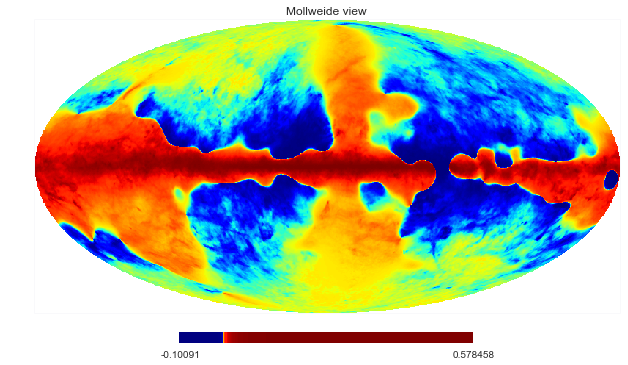

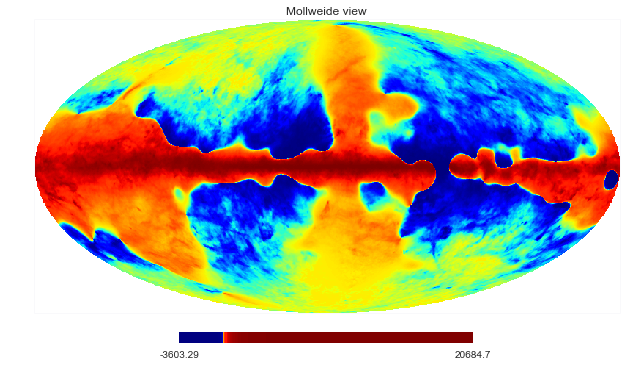

In [528]:
#     Qweights = lib.ilc.compute_ilc_weights(totalQmaps)
#     Uweights = lib.ilc.compute_ilc_weights(totalUmaps)

#     ilcQmap = np.dot(Qweights, totalQmaps)
#     ilcUmap = np.dot(Uweights, totalUmaps)

Qweights = lib.ilc.compute_ilc_weights(totalQmaps)
Uweights = lib.ilc.compute_ilc_weights(totalUmaps)

ilcQmap = np.dot(Qweights, totalQmaps)
ilcUmap = np.dot(Uweights, totalUmaps)

print frequencies/1.e9
print Qweights
print Uweights

dQ = np.abs((ilcQmap - cmbQUmaps[0])/cmbQUmaps[0]) + .01
print dQ.min(), dQ.max()
dU = np.abs((ilcUmap - cmbQUmaps[1])/cmbQUmaps[1]) + .01

print ilcQmap.mean(), ilcQmap.std()
print cmbQUmaps[0].mean(), cmbQUmaps[0].std()
print dQ.mean(), dQ.std()

hp.mollview(ilcQmap - cmbQUmaps[0], norm='hist')
hp.mollview(dustmaps[0][0], norm='hist')

# hist(dQ, log=True)
# figure()
# hp.mollview(dQ, norm='log', min=.01, max=.1)

In [529]:
S = cmbQUmaps[0]

for i in range(len(dustmaps)):
    F = dustmaps[i][0]
    print "bias factor @ {0} GHz, <SF>/<FF> =".format(frequencies[i]/1.e9), np.mean(S*F)/np.mean(F*F)
    Savg = np.mean(S)
    Favg = np.mean(F)
    Thatavg = np.mean(ilcQmap)
    print "bias factor2 @ {0} GHz, (<S> - <That>)/<F> =".format(frequencies[i]/1.e9), (Savg - Thatavg)/Favg

bias factor @ 200.0 GHz, <SF>/<FF> = -1.89555601586e-05
bias factor2 @ 200.0 GHz, (<S> - <That>)/<F> = -2.80011495771e-05
bias factor @ 270.0 GHz, <SF>/<FF> = -1.08813392826e-05
bias factor2 @ 270.0 GHz, (<S> - <That>)/<F> = -1.60739122843e-05


In [573]:
sigmaB2 = np.var(Qmap)
ones = np.ones([len(dustmaps), 1])

X = [covcoeff(Qmap, dustmaps[i][0]) for i in range(len(dustmaps))]
X = np.array([X]).T  # Make sure N_freqs x 1

F = np.cov(np.array(dustmaps)[..., 0])  # cov(R, R)

C = sigmaB2*ones*ones.T + X*ones.T + ones*X.T + F
Cinv = np.linalg.pinv(C)

print "det C =", np.linalg.det(C)
print "cond C =", np.linalg.cond(C) #np.linalg.norm(C)*np.linalg.norm(Cinv)
print "cond C =", np.linalg.norm(C)*np.linalg.norm(Cinv)
print "C =\n", C
print "C^-1 =\n", Cinv

det C = 172.13051595
cond C = 35.7338073468
cond C = 35.7617920502
C =
[[ 25.20186903  34.99383031]
 [ 34.99383031  55.42044022]]
C^-1 =
[[ 0.32196755 -0.20329824]
 [-0.20329824  0.1464114 ]]


In [574]:
print ones*X.T - np.outer(ones, X)
print X*ones.T - np.outer(X, ones)

[[ 0.  0.]
 [ 0.  0.]]
[[ 0.  0.]
 [ 0.  0.]]


In [597]:
print np.einsum("ij,jk,kl", ones.T, G_Q, ones)

def magnitude(A):
    wons = np.ones(len(A))
    return np.einsum("i,ij,j", wons, G_Q, wons)

print magnitude(G_Q)

[[ 111.66756077]]
111.667560772


In [578]:
def covcoeff(x, y):
    return np.mean(x*y) - np.mean(x)*np.mean(y)

X_Q = [covcoeff(Qmap, dustmaps[i][0]) for i in range(len(dustmaps))]
X_Q = np.array([X_Q]).T  # Make sure 1 x N_freqs

F_Q = np.cov(np.array(dustmaps)[..., 0])  # cov(R, R)

ones = np.ones([len(dustmaps), 1])

G_Q = F_Q + ones*X_Q.T
G_Qinv = np.linalg.pinv(G_Q)
F_Qinv = np.linalg.pinv(F_Q)

print "det =\n", np.linalg.det(G_Q)
print "G.G^-1 =\n", np.dot(G_Q, G_Qinv)
print "G =\n", G_Q
print "G^-1 =\n", G_Qinv
print "condition number =\n", np.linalg.cond(G_Q)

print "det =\n", np.linalg.det(F_Q)
print "F.F^-1 =\n", np.dot(F_Q, F_Qinv)
print "F =\n", F_Q
print "F^-1 =\n", F_Qinv
print "condition number =\n", np.linalg.cond(F_Q)

det =
4.5387727773e-06
G.G^-1 =
[[  1.00000009e+00  -2.98023224e-08]
 [  5.96046448e-08   9.99999970e-01]]
G =
[[ 13.19627848  22.98823977]
 [ 27.5282163   47.95482621]]
G^-1 =
[[ 10565593.60757547  -5064858.29142792]
 [ -6065123.55854286   2907455.34092085]]
condition number =
828433005.686
det =
0.0
F.F^-1 =
[[ 0.24785302  0.43176602]
 [ 0.43176602  0.75214698]]
F =
[[ 19.31464301  33.64658083]
 [ 33.64658083  58.61316727]]
F^-1 =
[[ 0.00318055  0.00554059]
 [ 0.00554059  0.00965184]]
condition number =
1.10147632603e+16


In [420]:
#     recon_cls = hp.anafast([Tmap, ilcQmap, ilcUmap])  # TT, EE,  BB, TE, EB, TB
#     labels = ['TT', 'EE', 'BB', 'TE', 'EB', 'TB']
#     recon_cldict = {labels[i]: recon_cls[i] for i in range(len(labels))}
#     recon_cldict['ell'] = np.arange(len(recon_cldict['TT']), dtype='float')
    
#     retdict = {'cl_in': cldict, 'cl_out': recon_cldict,
#                'cmbTmap': Tmap, 'cmbQUmaps': cmbQUmaps, 'dustmaps': dustmaps,
#                'totalQUmaps': totalQUmaps,
#                'weights_Q': Qweights, 'weights_U': Uweights,
#                'ilcQmap': ilcQmap, 'ilcUmap': ilcUmap}

#     return retdict

recon_cls = hp.anafast([Tmap, ilcQmap, ilcUmap])  # TT, EE,  BB, TE, EB, TB
labels = ['TT', 'EE', 'BB', 'TE', 'EB', 'TB']
recon_cldict = {labels[i]: recon_cls[i] for i in range(len(labels))}
recon_cldict['ell'] = np.arange(len(recon_cldict['TT']), dtype='float')

retdict = {'cl_in': cldict, 'cl_out': recon_cldict,
           'cmbTmap': Tmap, 'cmbQUmaps': cmbQUmaps, 'dustmaps': dustmaps,
           'totalQUmaps': totalQUmaps,
           'weights_Q': Qweights, 'weights_U': Uweights,
           'ilcQmap': ilcQmap, 'ilcUmap': ilcUmap}

(1, 500)

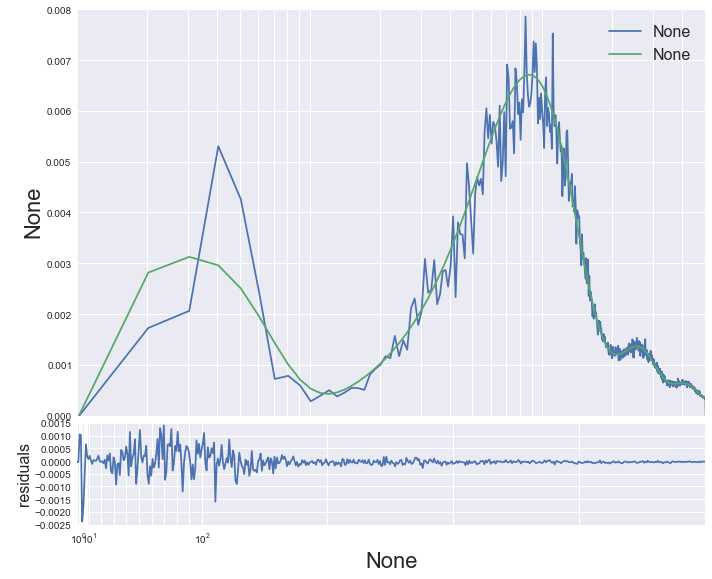

In [421]:
clin = retdict['cl_in']
infact = clin['ell']*(clin['ell'] + 1)/(2*np.pi)
clout = retdict['cl_out']
outfact = clout['ell']*(clout['ell'] + 1)/(2*np.pi)


figtest, axestest = resid_plot(clout['ell'], outfact*clout['BB'], clin['ell'], infact*clin['BB'])
axestest[0].set_xscale('log')
axestest[0].set_xlim([1, 500])


# Messing around with CLASS

In [3]:
reload(lib.cmb)
import lib.cmb

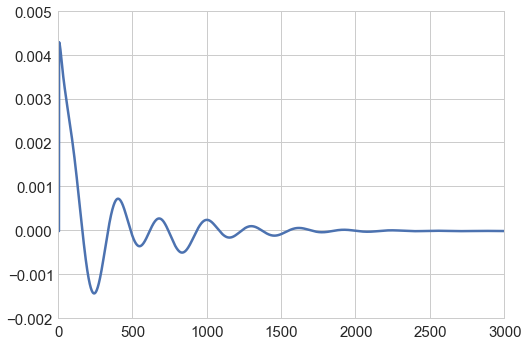

In [161]:
ells_lensed = lib.cmb.get_lcdm_cls(True)['ell']
TTs_lensed = lib.cmb.get_lcdm_cls(True)['TT']
ells_unlensed = lib.cmb.get_lcdm_cls(False)['ell']
TTs_unlensed = lib.cmb.get_lcdm_cls(False)['TT']
# plot(ells_unlensed, TTs_unlensed, label='unlensed')
# plot(ells_lensed, TTs_lensed, label='lensed')

ells_diff = ells_lensed
TTs_diff = TTs_lensed - TTs_unlensed[:len(ells_diff)]

plot(ells_diff, TTs_diff, label='diff')

In [179]:
ilcmap = lib.wmap.load_wmap_maps(['data/wmap_ilc_9yr_v5.fits'])[0]

# cldict = lib.cmb.get_lcdm_cls(True)
# ells = cldict['ell']   # 1/rad
# TTs = cldict['TT']  # uK^2
# EEs = cldict['EE']  # uK^2
# TEs = cldict['TE']  # uK^2
# BBs = cldict['BB']  # uK^2

# TTmap = hp.synfast(TTs, nside=512)
# hp.mollview(TTmap/1.e3, unit='mK')
# hp.mollview(ilcmap, unit='mK')

# Tmap, Qmap, Umap = hp.synfast([TTs, EEs, BBs, TEs], nside=512, new=True, pol=True)
Tmap, Qmap, Umap = lib.cmb.generate_lcdm_maps(n2r=True)

Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


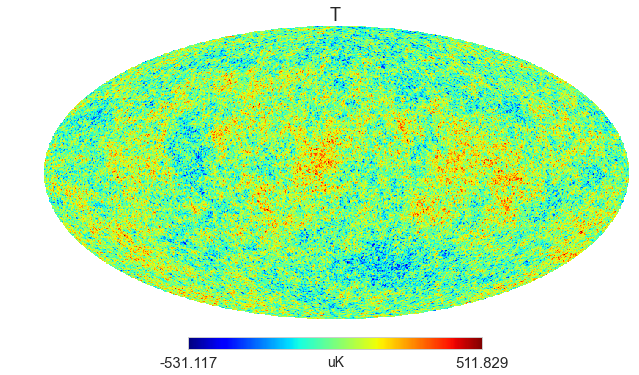

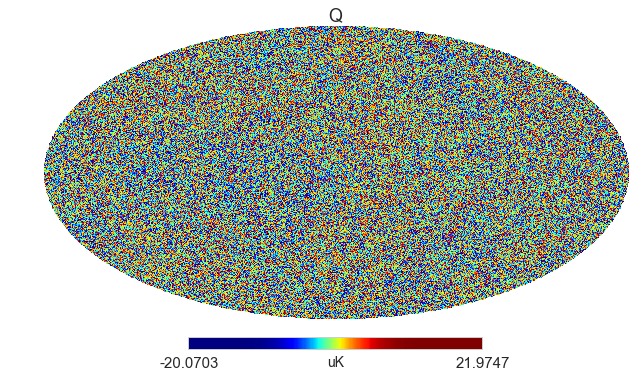

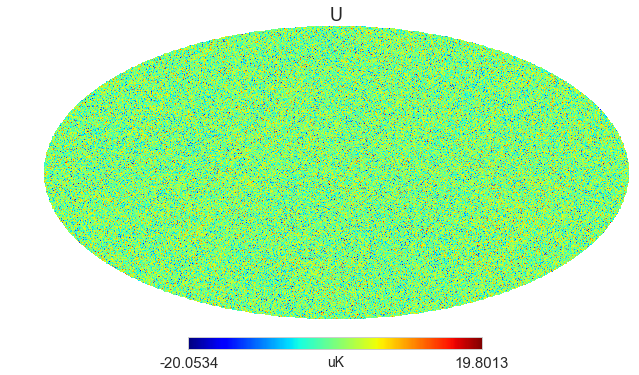

In [182]:
hp.mollview(Tmap, unit='uK', title='T')
hp.mollview(Qmap, unit='uK', title='Q', norm='hist', nest=False)
hp.mollview(Umap, unit='uK', title='U')

In [12]:
#sns.set_style('whitegrid')
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

In [140]:
print ells[:10]
print TTs[:10]

[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[   0.            0.          980.78143996  927.74297424  875.7440873
  835.63245842  807.05526219  787.82929472  776.49767959  770.58550408]


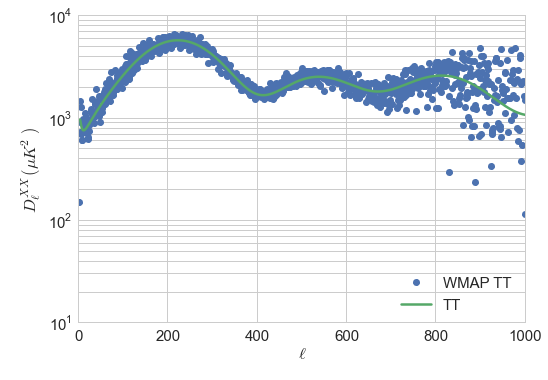

In [138]:
#cldict = lib.cmb.get_lcdm_lensed_cls()
cldict = lib.cmb.get_lcdm_cls(True)
ells = cldict['ell']
TTs = cldict['TT']
EEs = cldict['EE']
TEs = cldict['TE']
BBs = cldict['BB']
plot(wmapells, wmapTTs, 'o', label='WMAP TT')
plot(ells, TTs, label='TT')
#plot(ells, EEs, label='EE')
#plot(ells, np.abs(TEs), label='|TE|')
#plot(ells, BBs, label='BB')

xlim([0, 1000])
#ylim(ymin=1.e-3)
yscale('log')
xlabel('$\ell$')
ylabel('$D_\ell^{XX} (\mu K^2)$')
legend(loc='lower right')#bbox_to_anchor=(1.5, 0.7))

In [51]:
import lib.ilc

ilcmap = lib.wmap.load_wmap_maps(['data/wmap_ilc_9yr_v5.fits'])[0]

In [87]:
ilcTTs = hp.anafast(ilcmap/1.e3, lmax=3500, pol=False)

In [82]:
wmapells, wmapTTs, _, _, _ = np.loadtxt('data/wmap_tt_spectrum_9yr_v5.txt').T

In [107]:
wmapells2 = np.hstack([[0, 1], wmapells])
wmapTTs2 = np.hstack([[0., 0.], wmapTTs])

In [115]:
# synfast expects a set of bare Cl's ranging from ell = 0 to ell = lmax. 
# The Cl's are related to the "standard" D_\ell by D_\ell = \ell*(\ell+1)/(2\pi)*C_\ell
# synfast will preserve units, e.g. if the Cl's are in uK^2, then the resulting map will be in uK
# and if the Cl's are in normalized (unitless) form, then the resulting map will be fractional
# anisotropies (unitless). 
wmapTTmap = hp.synfast(wmapTTs*2*np.pi/(wmapells*(wmapells+1)), nside=512)  # uK^2 -> uK
#hp.mollview(wmapTTmap/1.e3, unit='mK', title='Synfast(WMAP $C_\ell^{TT}$)')
#hp.mollview(ilcmap, unit='mK', title='WMAP ILC Temperature')

wmapTTspost = hp.anafast(wmapTTmap)  # uK -> uK^2
wmapellspost = np.arange(len(wmapTTspost))

Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


The order of the input cl's will change in a future release.
Use new=True keyword to start using the new order.
See documentation of healpy.synalm.


[  150.6398   902.1805   730.3626  1467.8517   688.5324]
[ 255.73787426  395.72130696   82.59767457  184.56615428   38.65654762]


(0.0, 10)

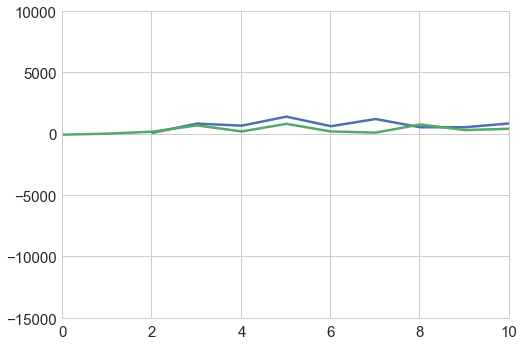

In [129]:
print wmapTTs[:5] # l(l+1)/(2pi)Cl in uK^2
print (wmapTTspost)[2:5+2]  # uK^2 (???)
plot(wmapells, wmapTTs)
plot(wmapellspost, wmapTTspost*wmapellspost*(wmapellspost+1)/(2*np.pi))
xlim(xmax=10)

Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


The order of the input cl's will change in a future release.
Use new=True keyword to start using the new order.
See documentation of healpy.synalm.


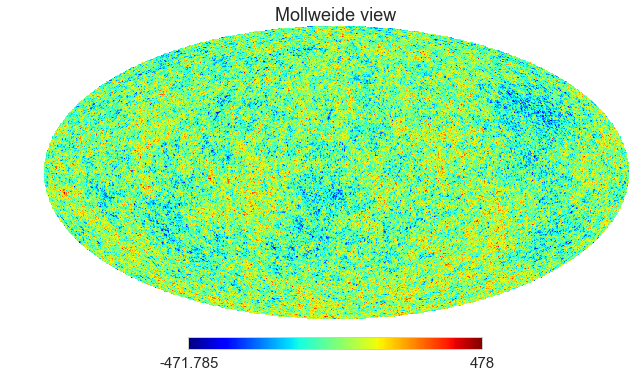

In [133]:
wmapTTspostmap = hp.synfast(wmapTTspost, nside=512)
hp.mollview(wmapTTspostmap)

In [92]:
ilcells = np.arange(len(ilcTTs))
print ilcells[:5]
print (ilcells*(ilcells+1)*ilcTTs*(2.735)**2)[:5]

print TTs[:5]

[0 1 2 3 4]
[  0.00000000e+00   2.32285425e-06   2.68767302e-05   1.20872182e-04
   4.85548724e-05]
[ 980.78143996  927.74297424  875.7440873   835.63245842  807.05526219]


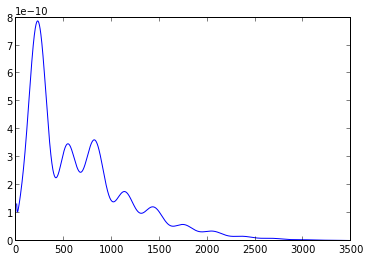

In [343]:
lcdm_cl = np.loadtxt('data/lcdm_cl.dat')
lcdm_cl.shape
ells = lcdm_cl.T[0]
TTs = lcdm_cl.T[1]

plot(ells, TTs)


In [339]:
pdict = lib.cmb.get_params_from_file('lcdm.ini')
cosmo = Class()
cosmo.set(pdict)
cosmo.struct_cleanup()
cosmo.compute()

CosmoSevereError: 

Error in Class: Class did not read input parameter(s): selection, P_k_max_h/Mpc, w0_fld, selection_width, bessels_verbose, z_pk, l_max_tensors, selection_mean, bessel file, wa_fld, cs2_fld


Following code from https://github.com/lesgourg/class_public/wiki/Python-wrapper

In [256]:
from classy import Class

In [311]:
# Define your cosmology (what is not specified will be set to CLASS default parameters)
params = {
    'output': 'tCl lCl pCl',
    'l_max_scalars': 2000,
    'lensing': 'yes',
    'A_s': 2.3e-9,
    'n_s': 0.9624, 
    'h': 0.6711,
    'omega_b': 0.022068,
    'omega_cdm': 0.12029,
    'modes': 's,t',
    'r': 0.01}

In [258]:
# Create an instance of the CLASS wrapper
cosmo = Class()

In [312]:
# Set the parameters to the cosmological code
cosmo.set(params)

# Run the whole code. Depending on your output, it will call the
# CLASS modules more or less fast. For instance, without any
# output asked, CLASS will only compute background quantities,
# thus running almost instantaneously.
# This is equivalent to the beginning of the `main` routine of CLASS,
# with all the struct_init() methods called.
cosmo.struct_cleanup()
cosmo.compute()

In [313]:
# Access the lensed cl until l=2000
lcls = cosmo.lensed_cl(2000)
rcls = cosmo.raw_cl(2000)

# Print on screen to see the output
print lcls.keys()
print rcls.keys()

['pp', 'bb', 'ee', 'tt', 'tp', 'te']
['pp', 'bb', 'ee', 'tt', 'tp', 'te']


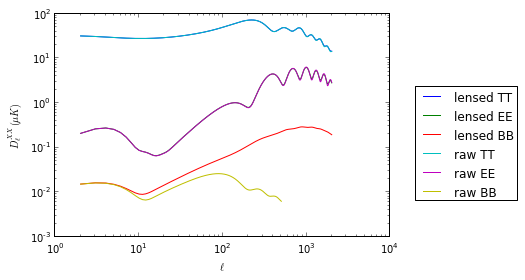

In [320]:
ells = np.arange(len(cls['tt']))
prefix = ells*(ells+1)/(2*np.pi)*(cosmo.T_cmb()*1.e6)**2
plot(ells, np.sqrt(prefix*lcls['tt']), label='lensed TT')
plot(ells, np.sqrt(prefix*lcls['ee']), label='lensed EE')
plot(ells, np.sqrt(prefix*lcls['bb']), label='lensed BB')
plot(ells, np.sqrt(prefix*rcls['tt']), label='raw TT')
plot(ells, np.sqrt(prefix*rcls['ee']), label='raw EE')
plot(ells, np.sqrt(prefix*rcls['bb']), label='raw BB')

xlabel('$\ell$')
ylabel('$D_\ell^{XX} (\mu K)$')
xscale('log')
yscale('log')

#xlim([0, 50])
legend(bbox_to_anchor=(1.4, 0.7))

In [290]:
# Clean CLASS (the equivalent of the struct_free() in the `main`
# of CLASS. This step is primordial when running in a loop over different
# cosmologies, as you will saturate your memory very fast if you ommit
# it.
cosmo.struct_cleanup()

# ILC Functions

In [253]:
from lib.wmap import load_wmap_masks, load_wmap_maps

load_wmap_masks('/Users/jlazear/github/cmb/data/wmap_ilc_rgn_defn_9yr_v5.fits')

(array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ..., 
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]], dtype=bool),
 array([0, 0, 0, ..., 0, 0, 0], dtype=uint16))

In [137]:
def load_wmap_maps(fnames, n2r=True):
    fname0 = fnames[0]
    Nbands = len(fnames)
    
    # Initialize array and populate first band
    with fits.open(fname0) as f0:
        Npix = f0[1].header['NAXIS2']
        a = np.empty([Nbands, Npix])
        a[0] = f0[1].data['TEMPERATURE']
    
    for i, fname in enumerate(fnames[1:]):
        with fits.open(fname) as f:
            a[i+1] = f[1].data['TEMPERATURE']
    
    if n2r:
        for i in range(a.shape[0]):
            a[i] = hp.reorder(a[i], n2r=True)
    
    return a

def load_wmap_masks(fname='data/wmap_ilc_rgn_defn_9yr_v5.fits', n2r=True):
    with fits.open(fname) as f:
        fdata = f[1]
        bitmask = fdata.data['TEMPERATURE'].astype('uint16')
        region = fdata.data['N_OBS']
        if n2r:
            bitmask = hp.reorder(bitmask, n2r=True)
            region = hp.reorder(region, n2r=True)

    masks = np.empty([12, len(bitmask)])
    for i in range(12):
        masks[i] = (bitmask >> i) & 1    
    return masks, region

def compute_ilc_weights(maps, mask=None):
    nd = np.ndim(mask)
    if nd == 0:
        return _compute_ilc_weights(maps)
    elif np.ndim(mask) == 1:
        maps = np.ma.masked_array(maps, np.logical_not(np.outer(np.ones(len(maps)), mask)))
        return _compute_ilc_weights(maps)
    else:
        ws = []
        for i in range(len(mask)):
            ms = np.ma.masked_array(maps, np.logical_not(np.outer(np.ones(len(maps)), mask[i])))
            w = _compute_ilc_weights(ms)
            ws.append(w)
        ws = np.array(ws)
        return ws
    
def _compute_ilc_weights(maps):
    if np.ma.isMaskedArray(maps):
        covfunc = lambda x: np.ma.compress_cols(np.ma.cov(x))
    else:
        covfunc = np.cov
    cov = covfunc(maps)
#    return cov #DELME
    icov = np.linalg.pinv(cov)#, rcond=1.e-4)  # Naive inversion, since cov ~ k x k is small
    sumicov = icov.sum(0)
    totalicov = sumicov.sum()
    w = sumicov/totalicov
    return w

def ilc_map_from_weights(maps, weights, regions_map, 
                         sigma=1.5*np.pi/180, 
                         return_weights_map=False):
    """
    Construct an ILC map from a set of raw temperature maps,
    a set of weights per region, and a map of regions.
    
    `maps` must have shape (Nfreq, Npix). `weights` must 
    have shape (Nregions, Nfreq). `regions_map` must have
    shape (Npix,) and each pixel should contain the integer
    identifier to which region the pixel is assigned. 
    
    `sigma` is the smoothing factor to reduce edge effects.
    It is applied to each region's weight map before
    multiplying into the raw maps. See Bennett 2003 or 
    Hinshaw 2007 for details. 
    
    All of the maps must be in RING format!
    """
    Thats = np.dot(weights, maps)
    That = np.zeros(Thats.shape[1])
    weights_map = np.zeros(Thats.shape[1])
    for i in range(len(Thats)):
        m = np.zeros_like(That)
        m[regions_map == i] = 1
        if sigma is not None:
            m = hp.smoothing(m, sigma=sigma, verbose=False) + m.mean()
        That += Thats[i]*m
        weights_map += m
        print "i={0} m.min, m.max = ".format(i), m.min(), m.max() #DELME
    That = That/weights_map
    if return_weights_map:
        return That, weights_map
    else:
        return That

In [254]:
# jlazear ILC map
bands = ['K', 'Ka', 'Q', 'V', 'W']
fnames = ['data/wmap_band_smth_imap_r9_9yr_{0}_v5.fits'.format(band) for band in bands]
maskdata = 'data/wmap_ilc_rgn_defn_9yr_v5.fits'

maps = load_wmap_maps(fnames)
masks, region = load_wmap_masks(maskdata)
ws = compute_ilc_weights(maps, masks)

T_hat_JL, wm_JL = ilc_map_from_weights(maps, ws, region, return_weights_map=True, sigma=1.5*np.pi/180)

# WMAP 
wmap_ws = np.array([[.1555, -.7572, -.2689, 2.2845, -.4138],
           [.0375, -.5137, .0223, 2.0378, -.5839],
           [.0325, -.3585, -.3103, 1.8521, -.2157],
           [-.0910, .1741, -.6267, 1.5870, -.0433],
           [-.0762, .0907, -.4273, .9707, .4421],
           [.1998, -.7758, -.4295, 2.4684, -.4629],
           [-.0880, .1712, -.5306, 1.0097, 0.4378],
           [.1578, -.8074, -.0923, 2.1966, -.4547],
           [.1992, -.1736, -1.8081, 3.7271, -.9446],
           [-.0813, -.1579, -.0551, 1.2108, .0836],
           [.1717, -.8713, -.1700, 2.8314, -.9618],
           [.2353, -.8325, -.6333, 2.8603, -.6298]])

T_hat_WMAP, wm_WMAP = ilc_map_from_weights(maps, wmap_ws, region, return_weights_map=True, sigma=1.5*np.pi/180)

ilcmap = load_wmap_maps(['data/wmap_ilc_9yr_v5.fits'])[0]

Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm

In [140]:
print "jlazear ILC weights"
linestr = "{0:^10} {1:^10} {2:^10} {3:^10} {4:^10} {5:^10}"
print linestr.format(*(['GROUP'] + bands))
for i in range(len(ws)):
    linelist = [i] + [str(w).ljust(8, '0')[:8] for w in ws[i]]
    print linestr.format(*linelist)
    
print "\nWMAP9 ILC weights"
print linestr.format(*(['GROUP'] + bands))
for i in range(len(wmap_ws)):
    linelist = [i] + [str(w).ljust(8, '0')[:8] for w in wmap_ws[i]]
    print linestr.format(*linelist)
    
wmin = min(ws.min(), wmap_ws.min())
wmax = max(ws.max(), wmap_ws.max())
dmin = (ws - wmap_ws).min()
dmax = (ws - wmap_ws).max()
dabs = max(abs(dmin), abs(dmax))

jlazear ILC weights
  GROUP        K          Ka         Q          V          W     
    0       0.155986   -0.76841   -0.24397   2.257494   -0.40108 
    1       0.055803   -0.64892   0.208869   1.945169   -0.56091 
    2       0.048720   -0.43987   -0.23540   1.851762   -0.22519 
    3       -0.09964   0.205965   -0.64152   1.560084   -0.02487 
    4       -0.07787   0.094598   -0.42622   0.967506   0.441998 
    5       0.209118   -0.80956   -0.41398   2.482037   -0.46760 
    6       -0.08915   0.169148   -0.51964   1.000231   0.439416 
    7       0.159301   -0.82604   -0.05642   2.157844   -0.43467 
    8       0.201858   -0.23001   -1.69478   3.628966   -0.90602 
    9       -0.09946   -0.10505   -0.05691   1.156837   0.104587 
    10      0.176710   -0.92922   -0.06826   2.746804   -0.92602 
    11      0.237338   -0.85279   -0.59759   2.827484   -0.61443 

WMAP9 ILC weights
  GROUP        K          Ka         Q          V          W     
    0       0.155500   -0.75720   -0.

-0.0530019504225 -7.11846264709e-05 0.000584945909012 0.0427570859055


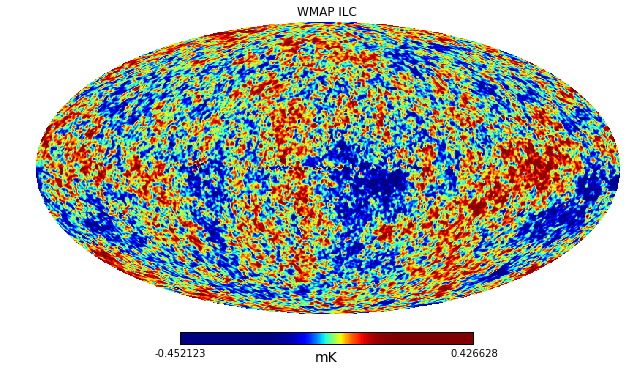

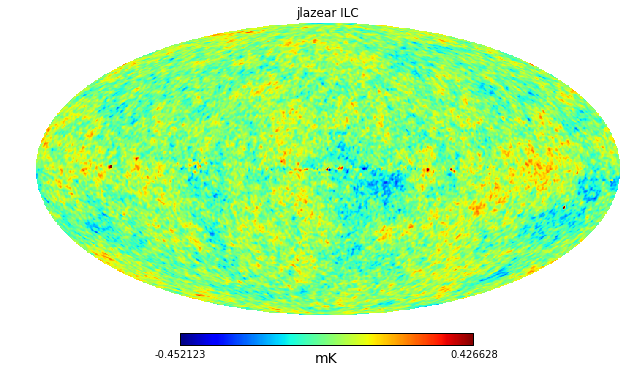

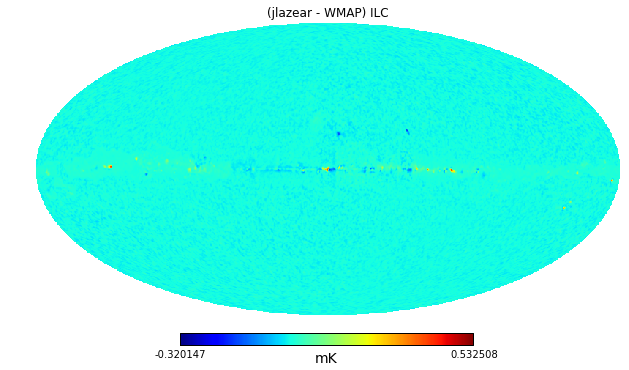

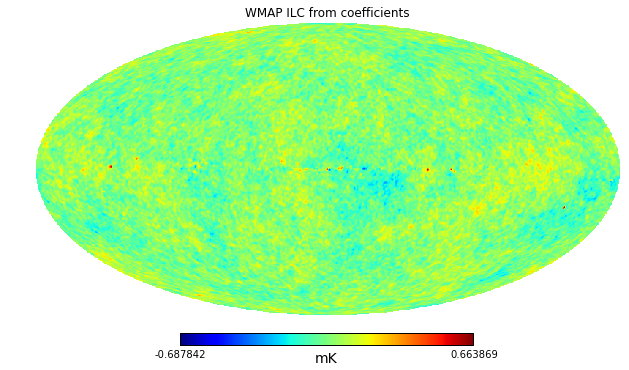

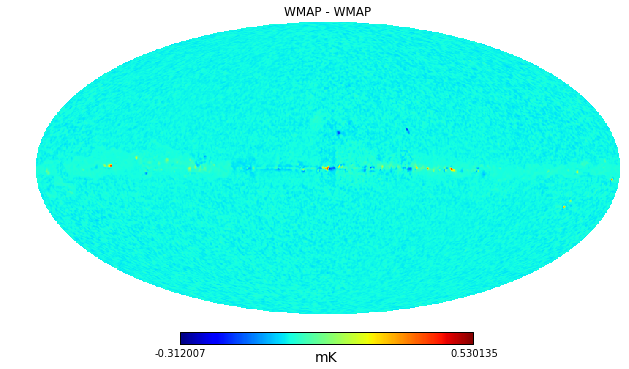

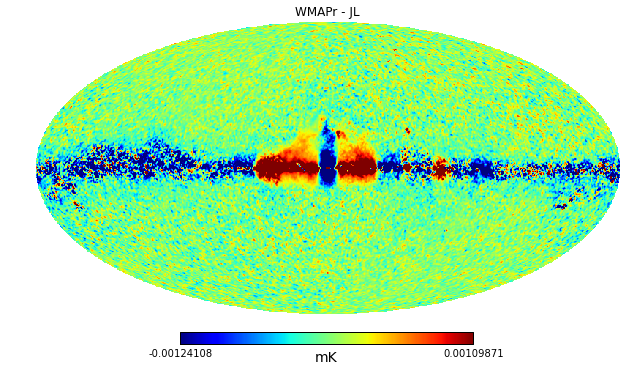

In [255]:
#hp.mollview(maps[0], nest=True)
mollret = hp.mollview(ilcmap, unit='mK', title='WMAP ILC',  norm='hist')
hp.mollview(T_hat_JL, unit='mK', title='jlazear ILC', min=-.452123, max=.426628)
hp.mollview((T_hat_JL - ilcmap), unit='mK', title='(jlazear - WMAP) ILC')
hp.mollview(T_hat_WMAP, unit='mK', title='WMAP ILC from coefficients')
hp.mollview(T_hat_WMAP - ilcmap, unit='mK', title='WMAP - WMAP')
delta = T_hat_WMAP - T_hat_JL
sigma_delta = delta.std()
mean_delta = delta.mean()
hp.mollview((T_hat_WMAP - T_hat_JL), unit='mK', title='WMAPr - JL', min=mean_delta-2*sigma_delta, max=mean_delta+2*sigma_delta)
print delta.min(), delta.mean(), delta.std(), delta.max()

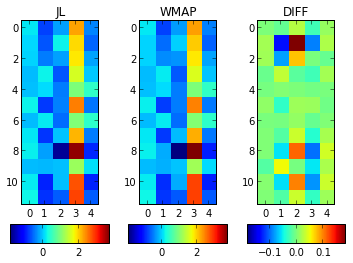

In [141]:
nrows = 2
ncols = 3
gs = gridspec.GridSpec(nrows, ncols, height_ratios=[10, 1])
#fig, axes = subplots(nrows=2, ncols=3, height_ratios=[10, 1])
fig = figure()
axes = np.array([[subplot(gs[j, i]) for i in range(ncols)] for j in range(nrows)])

im0 = axes[0, 0].imshow(ws, interpolation='nearest', vmin=wmin, vmax=wmax)
im1 = axes[0, 1].imshow(wmap_ws, interpolation='nearest', vmin=wmin, vmax=wmax)
im2 = axes[0, 2].imshow(ws-wmap_ws, interpolation='nearest', vmin=-dabs, vmax=dabs)

cb0 = fig.colorbar(im0, cax=axes[1, 0], orientation='horizontal')
cb1 = fig.colorbar(im1, cax=axes[1, 1], orientation='horizontal')
cb2 = fig.colorbar(im2, cax=axes[1, 2], orientation='horizontal')

for cb in [cb0, cb1, cb2]:
    tick_locator = ticker.MaxNLocator(nbins=4)
    cb.locator = tick_locator
    cb.update_ticks()
    
for i, title in enumerate(['JL', 'WMAP', 'DIFF']):
    ax = axes[0, i]
    ax.set_title(title)

1.0 1.0


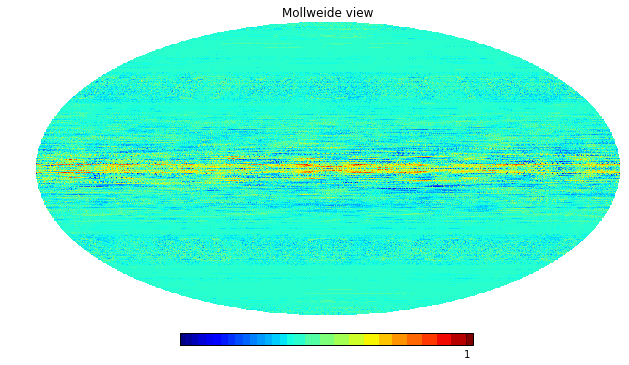

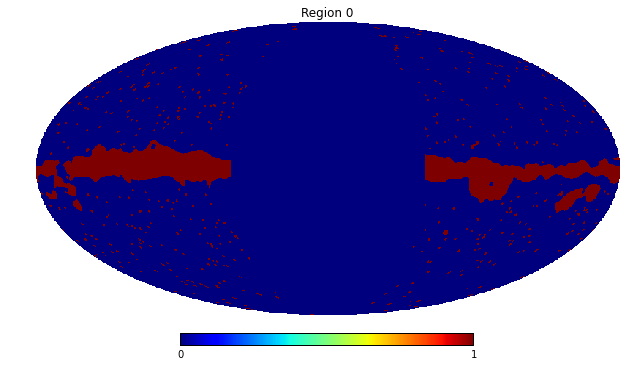

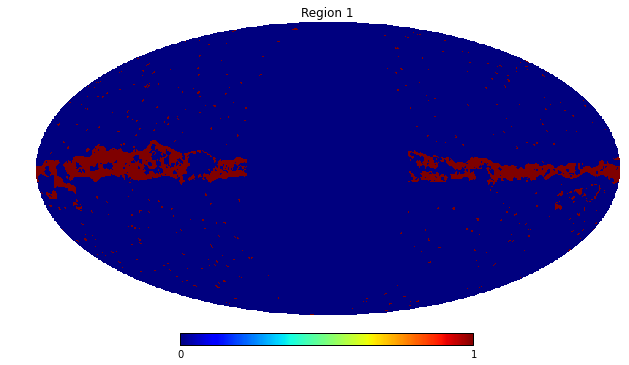

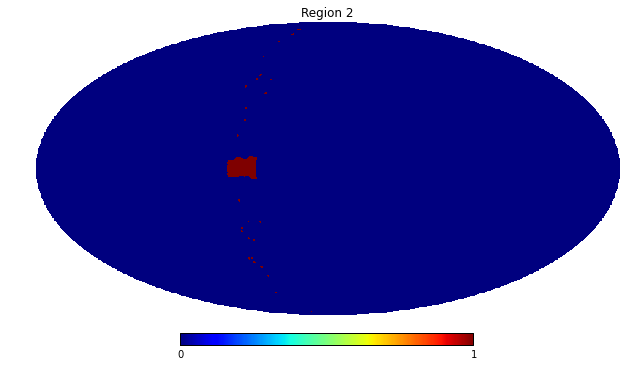

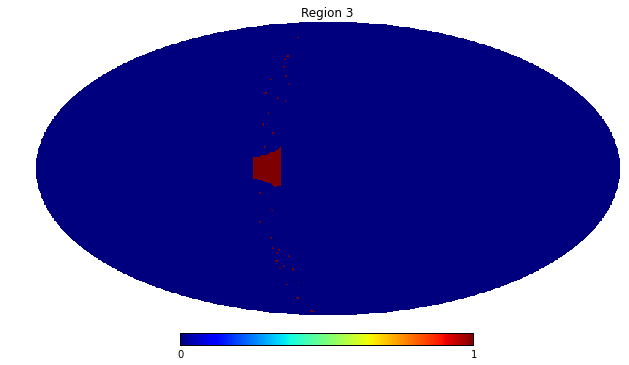

...

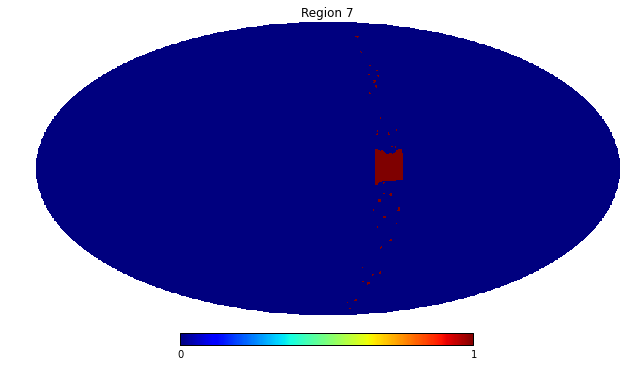

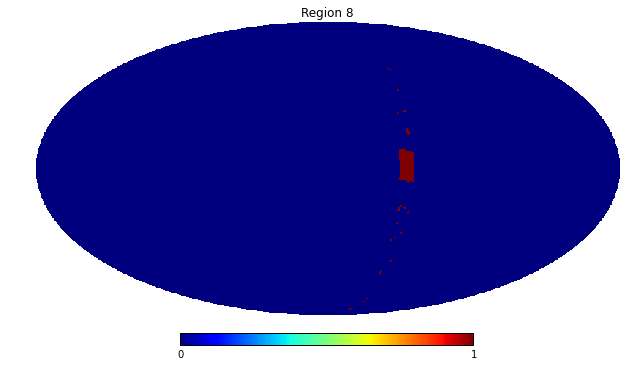

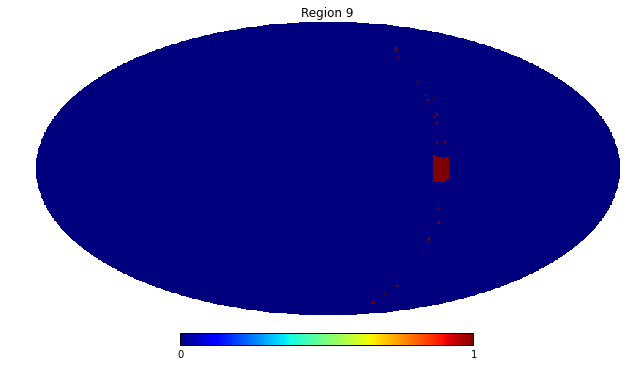

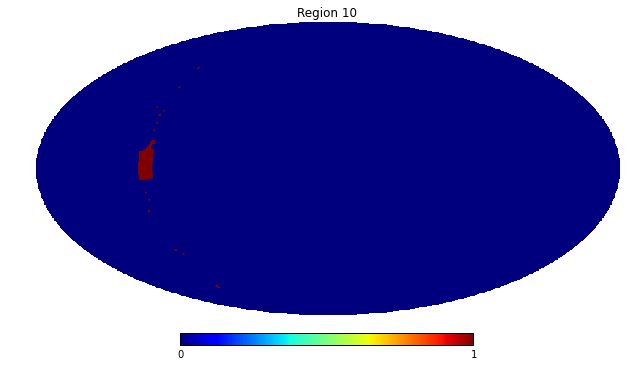

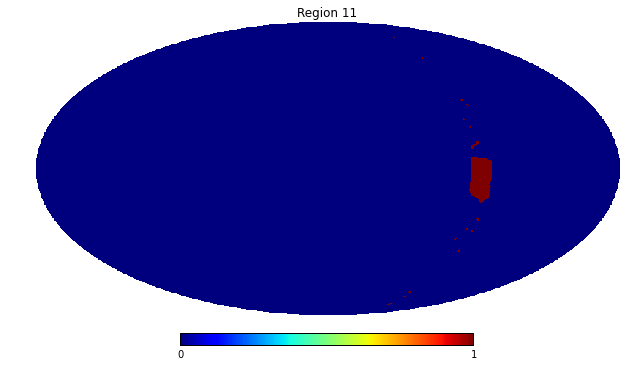

In [142]:
print wm_JL.max(), wm_JL.min()
hp.mollview(wm_JL, nest=False)
total_wmap = np.zeros_like(wm_JL)
for i in range(len(masks)):
    hp.mollview(masks[i], title='Region {0}'.format(i))
#    smmask0 = hp.smoothing(masks[i], sigma=1.5*np.pi/180., verbose=False)
#    hp.mollview(smmask0, title='smoothed {0}'.format(i))
#    total_wmap += smmask0
#    hp.mollview(total_wmap, title='Total {0}'.format(i))

# Regions

In [3]:
fnameregn = 'data/wmap_ilc_rgn_defn_9yr_v5.fits'
fregnfits = fits.open(fnameregn)
fregndata = fregnfits[1]
bitmask = fregnfits[1].data['TEMPERATURE'].astype('uint16')
region = fregnfits[1].data['N_OBS']

regions = [(bitmask >> n) & 1 for n in range(12)]

In [127]:
import scipy.constants
h = scipy.constants.h
kB = scipy.constants.k
c = scipy.constants.c

def B(T, nu):
    return (2*h*nu**3/(c**2)) / (np.exp(h*nu/(kB*T)) - 1)

def Binv(I, nu):
    return (h*nu/kB) / np.log(1 + 2*h*nu**3/(I*c*c))

def Binvapprox(I, nu):
    return c*c*I/(2*kB*nu*nu)

bands = ['K', 'Ka', 'Q', 'V', 'W']
fnames = ['data/wmap_band_smth_imap_r9_9yr_{0}_v5.fits'.format(band) for band in bands]
maskdata = 'data/wmap_ilc_rgn_defn_9yr_v5.fits'

maps = load_wmap_maps(fnames, n2r=False)

# Dust

In [178]:
reload(lib.foregrounds)
import lib.foregrounds

512

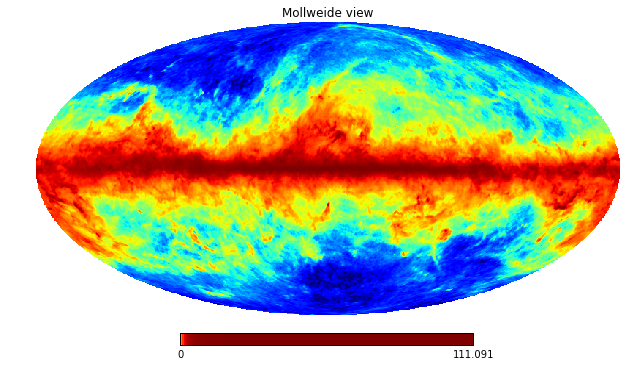

In [179]:
dust200 = lib.foregrounds.generate_simple_dust_map(200.e9, Nside=512)
hp.mollview(dust200, nest=True, norm='hist')
hp.npix2nside(len(dust200))

monopole: 1.59035


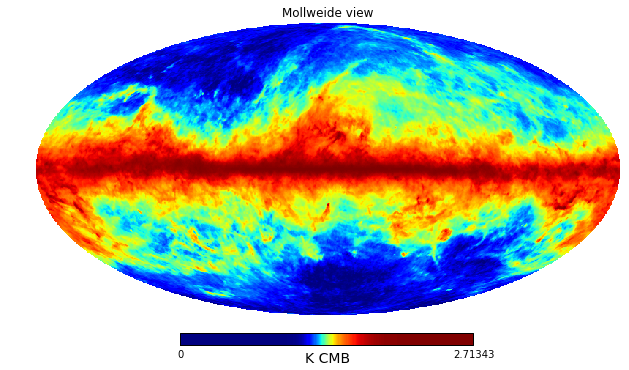

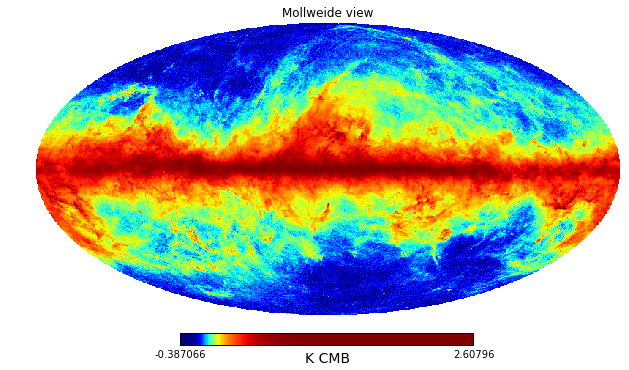

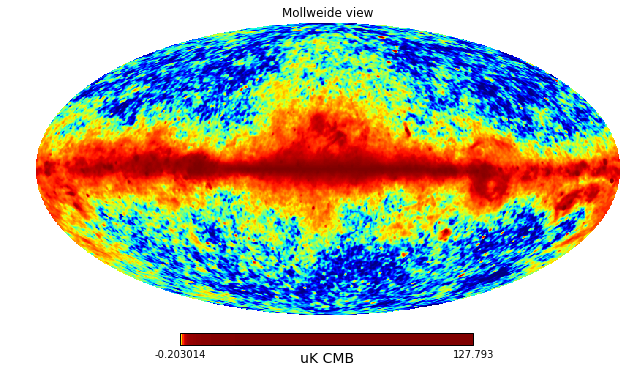

In [139]:
nu0 = 353.e9
#print 2*h*nu0**3/(c*c)
#2*h*nu0**3/(dust353map*1.e6*c*c)
hp.mollview(Binv(dust353map/1.e20, nu0), nest=True, norm='hist', unit='K CMB')
hp.mollview(Binv(planck353map/1.e20, 353.e9), nest=True, norm='hist', unit='K CMB', remove_mono=True)
hp.mollview(maps[0], nest=True, norm='hist', unit='uK CMB')

monopole: 1.59035
monopole: 1.58848


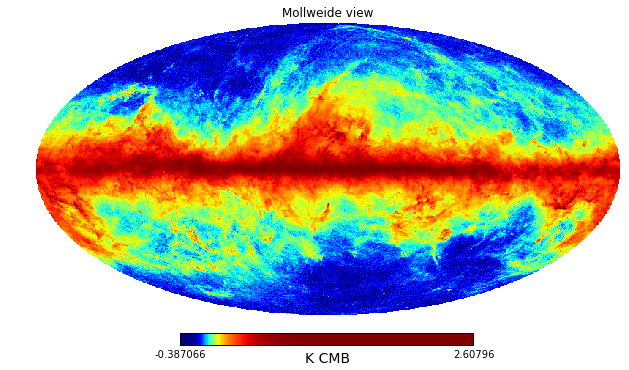

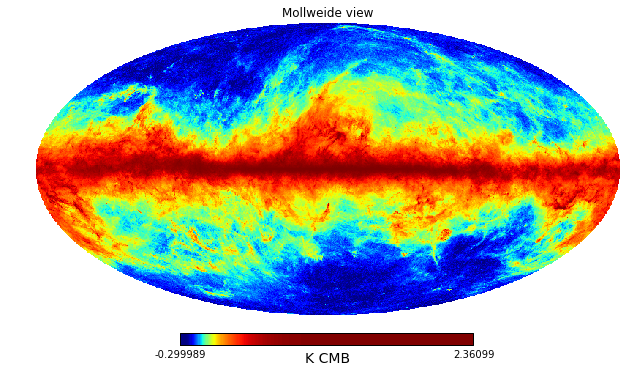

In [143]:
planck353fname = 'data/HFI_SkyMap_545_2048_R1.10_nominal.fits'
planck353 = fits.open(planck353fname)
planck353map = planck353[1].data['I_STOKES']  # MJy/sr
hp.mollview(Binv(planck353map/1.e20, 353.e9), nest=True, norm='hist', unit='K CMB', remove_mono=True)
planck353map512 = hp.ud_grade(planck353map, nside_out=512, order_in='NESTED', order_out='NESTED')
hp.mollview(Binv(planck353map512/1.e20, 353.e9), nest=True, norm='hist', unit='K CMB', remove_mono=True)

In [113]:
dust353[1].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / 8-bit bytes                                    
NAXIS   =                    2 / 2-dimensional binary table                     
NAXIS1  =                   24 / width of table in bytes                        
NAXIS2  =               786432 / number of rows in table                        
PCOUNT  =                    0 / size of special data area                      
GCOUNT  =                    1 / one data group (required keyword)              
TFIELDS =                    6 / number of fields in each row                   
TTYPE1  = 'I       '           / label for field   1                            
TFORM1  = 'E       '           / data format of field: 4-byte REAL              
TUNIT1  = 'MJy/sr  '           / physical unit of field                         
TTYPE2  = 'I_stdev '           / label for field   2                            
TFORM2  = 'E       '        

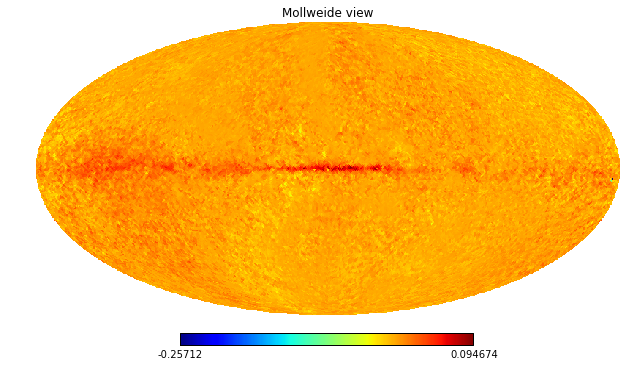

In [222]:
reload(lib.wmap)
import lib.wmap

mcmcw = fits.open('data/wmap_mcmc_w_dust_stk_q_7yr_v4p1.fits')

hp.mollview(mcmcw[1].data['BESTFIT'], nest=True)

In [251]:
fnames = ['docs/img/Q.png', 'docs/img/U.png']
all(map(os.path.isfile, fnames))

True

Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


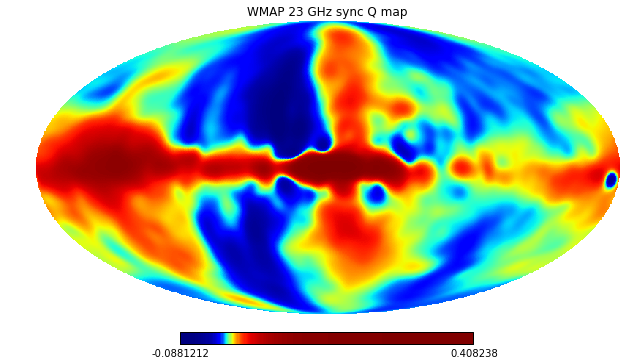

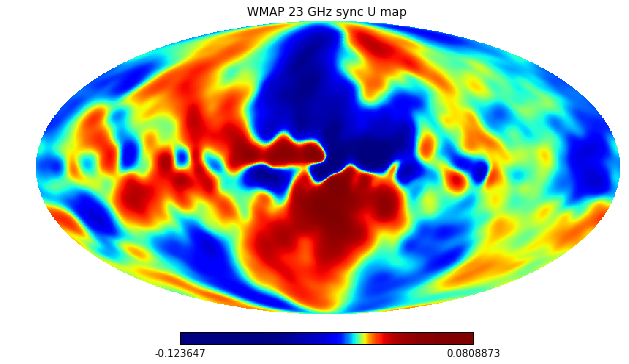

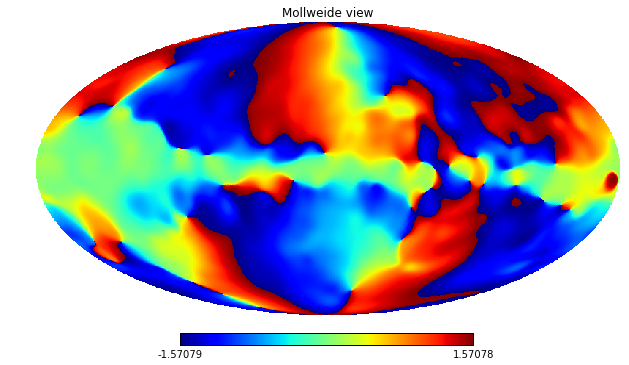

In [246]:
qmap = lib.wmap.load_wmap_maps_QU(['data/wmap_mcmc_k_synch_stk_q_7yr_v4p1.fits',
                                   'data/wmap_mcmc_k_synch_stk_u_7yr_v4p1.fits'], 
                                  Nside=256, n2r=True)

qmap[0] = hp.smoothing(qmap[0], sigma=3*np.pi/180, verbose=False)
qmap[1] = hp.smoothing(qmap[1], sigma=3*np.pi/180, verbose=False)


hp.mollview(qmap[0], nest=False, title='WMAP 23 GHz sync Q map', norm='hist')
hp.mollview(qmap[1], nest=False, title='WMAP 23 GHz sync U map', norm='hist')
hp.mollview(0.5*np.arctan2(-qmap[1], qmap[0]), nest=False)

In [196]:
ls data

COM_CompMap_dust-commrul_0256_R1.00.fits
NOTES.md
get_data.py
wmap_band_smth_imap_r9_9yr_K_v5.fits
wmap_band_smth_imap_r9_9yr_Ka_v5.fits
wmap_band_smth_imap_r9_9yr_Q_v5.fits
wmap_band_smth_imap_r9_9yr_V_v5.fits
wmap_band_smth_imap_r9_9yr_W_v5.fits
wmap_band_smth_imap_r9_nineyear_v5.tar.gz
wmap_ilc_9yr_v5.fits
wmap_ilc_rgn_defn_9yr_v5.fits
wmap_mcmc_w_dust_stk_q_7yr_v4p1.fits
wmap_mcmc_w_dust_stk_u_7yr_v4p1.fits


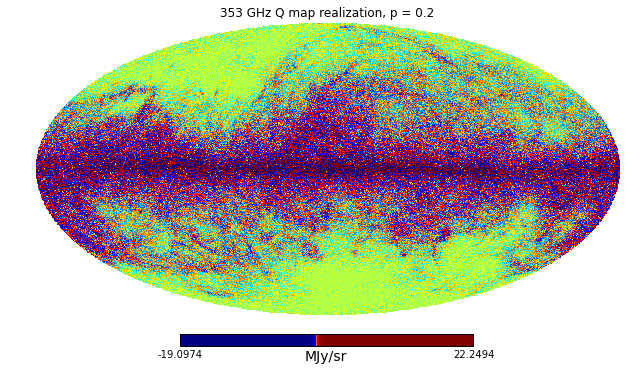

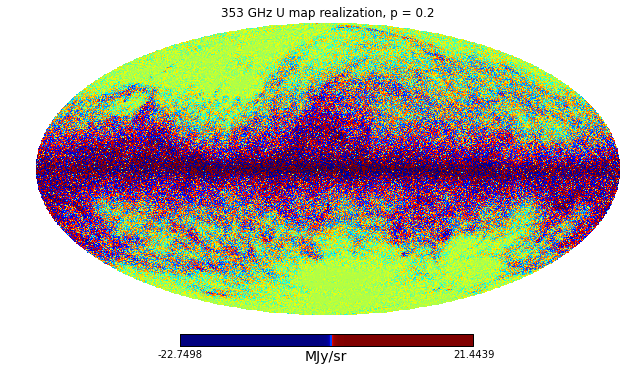

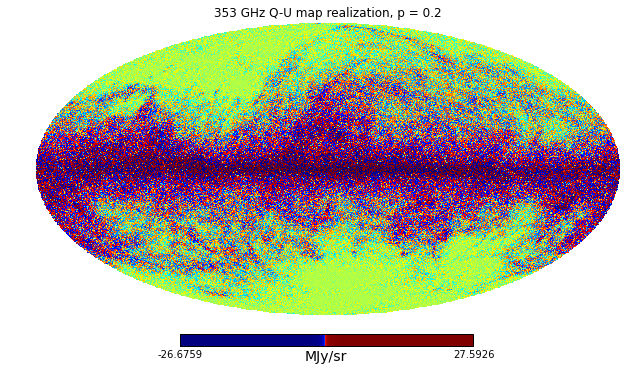

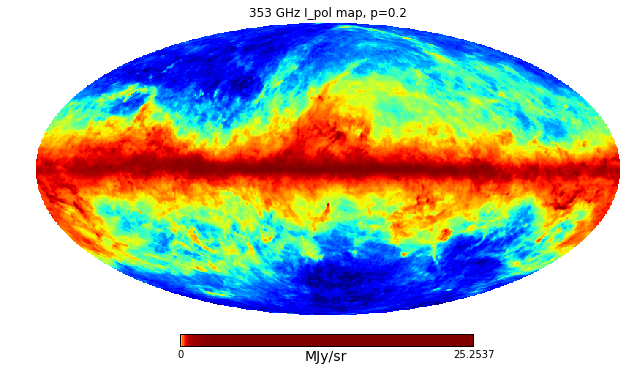

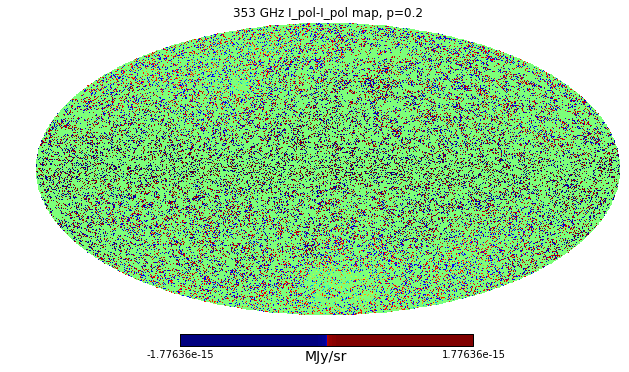

In [191]:
reload(lib.foregrounds)
import lib.foregrounds

QUmaps = lib.foregrounds.generate_simple_dust_QU_map()

hp.mollview(QUmaps[0], nest=True, norm='hist', title='353 GHz Q map realization, p = 0.2', unit='MJy/sr')
hp.mollview(QUmaps[1], nest=True, norm='hist', title='353 GHz U map realization, p = 0.2', unit='MJy/sr')
hp.mollview(QUmaps[1] - QUmaps[0], nest=True, norm='hist', 
            title='353 GHz Q-U map realization, p = 0.2', unit='MJy/sr')
hp.mollview(np.sqrt(QUmaps[0]**2 + QUmaps[1]**2), nest=True, norm='hist', unit='MJy/sr',
            title='353 GHz I_pol map, p=0.2')
hp.mollview(np.sqrt(QUmaps[0]**2 + QUmaps[1]**2) - 0.2*lib.foregrounds.generate_simple_dust_map(),
            nest=True, norm='hist', title='353 GHz I_pol-I_pol map, p=0.2', unit='MJy/sr')

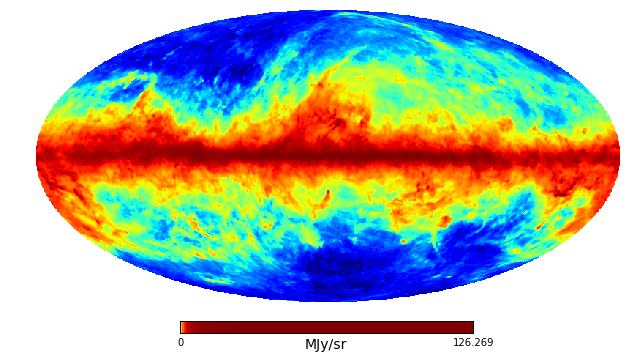

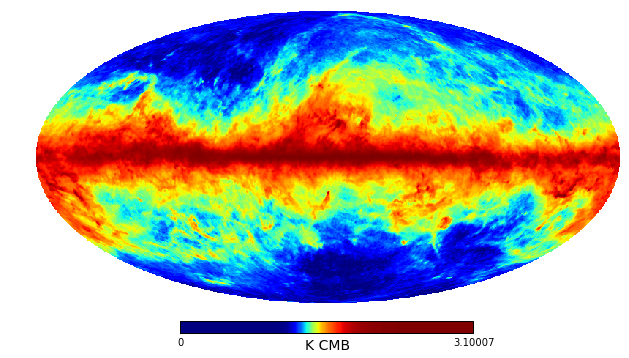

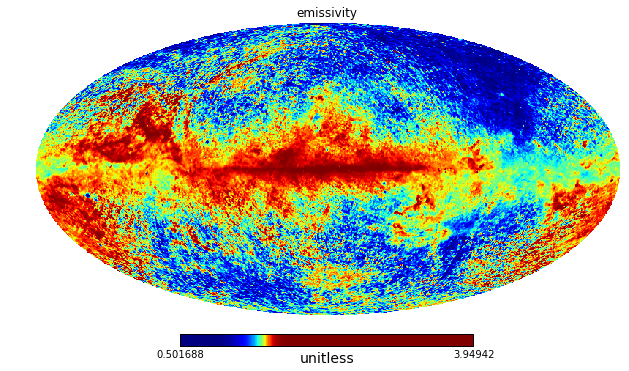

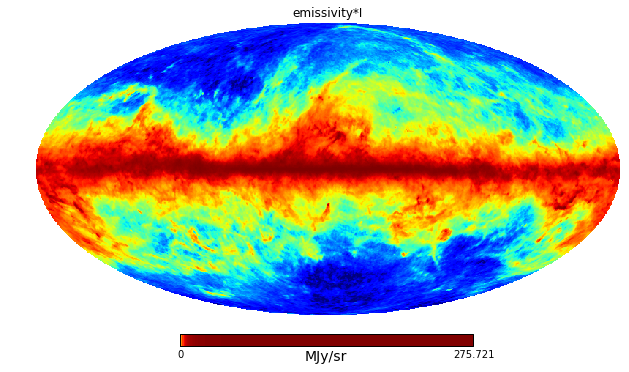

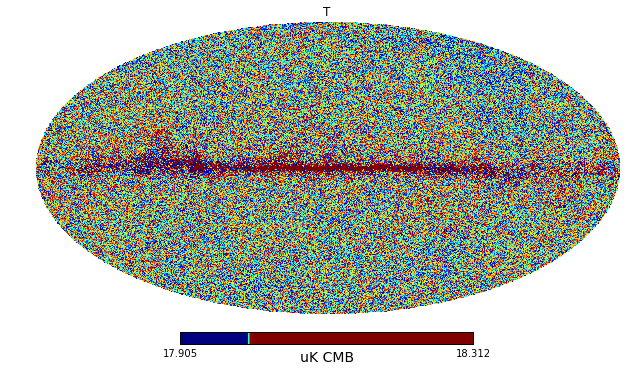

In [147]:
def clean_dust_map(map):
    """Replaces non-positive pixels with smallest positive pixel value."""
    pos = map[map > 0]
    posmin = pos.min()
    map[map <= 0] = 0.# posmin
    return map

dust353fname = 'data/COM_CompMap_dust-commrul_0256_R1.00.fits'
dust353 = fits.open(dust353fname)
dust353map = dust353[1].data['I']
dust353map = clean_dust_map(dust353map)
dust353em = dust353[1].data['Em']
dust353T = dust353[1].data['T']

hp.mollview(dust353map, nest=True, norm='hist', unit='MJy/sr', title='')
#savefig('planck_dust_353GHz.png')
dust353mapT = Binv(dust353map*dust353em/1.e20, 353.e9)
hp.mollview(dust353mapT, nest=True, norm='hist', unit='K CMB', title='')
hp.mollview(dust353em, nest=True, norm='hist', unit='unitless', title='emissivity')
hp.mollview(dust353em*dust353map, nest=True, norm='hist', unit='MJy/sr', title='emissivity*I')
hp.mollview(dust353T, nest=True, norm='hist', unit='uK CMB', title='T')

#dust353[1].header

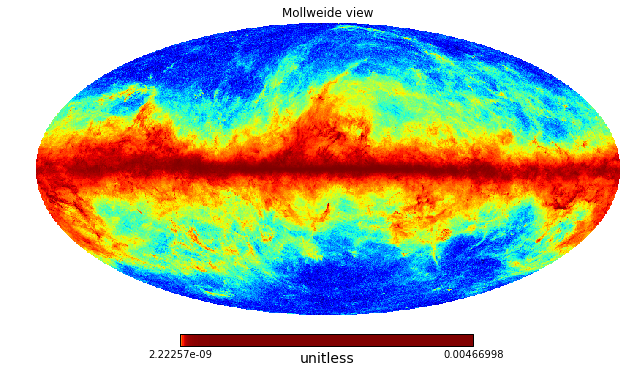

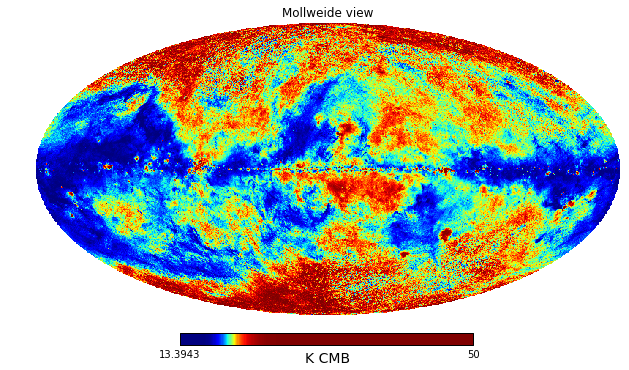

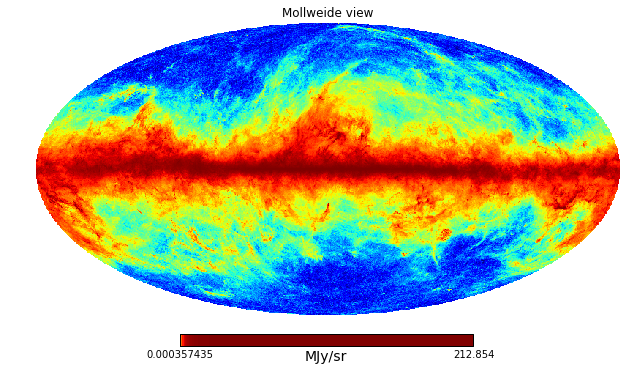

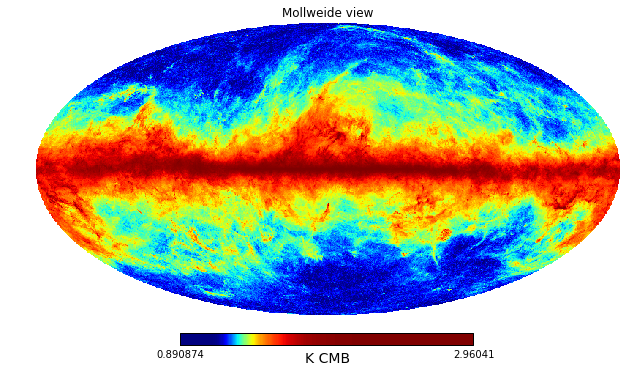

In [149]:
dustmodelfname = 'data/HFI_CompMap_ThermalDustModel_2048_R1.20.fits'
dustmodel = fits.open(dustmodelfname)
dustmodeltau = dustmodel[1].data['TAU353']
dustmodeltemp = dustmodel[1].data['TEMP']

dustmodelI = B(dustmodeltemp, 353.e9)*dustmodeltau*1.e20  # MJy/sr
hp.mollview(dustmodeltau, nest=True, unit='unitless', norm='hist')
hp.mollview(dustmodeltemp, nest=True, unit='K CMB', norm='hist')
hp.mollview(dustmodelI, unit='MJy/sr', nest=True, norm='hist')
hp.mollview(Binv(dustmodelI/1.e20, 353.e9), unit='K CMB', norm='hist', nest=True)

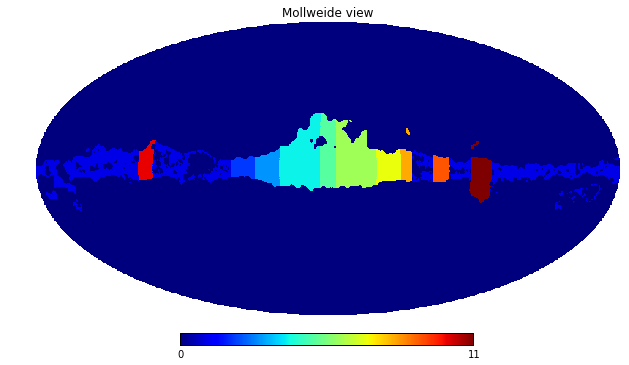

In [120]:
hp.mollview(region, nest=True)

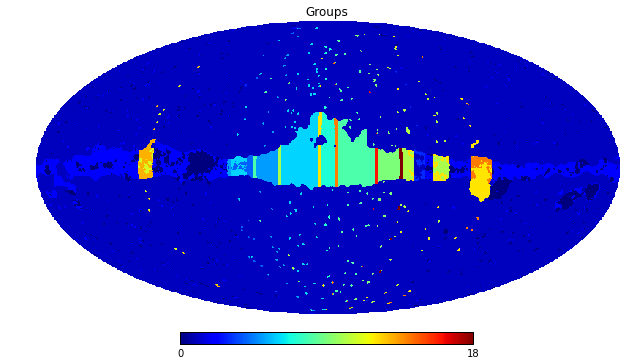

In [115]:
summap = sum(regions[i]*(i+1) for i in range(len(regions)))
hp.mollview(summap, nest=True, title='Groups')